In [1]:
import warnings

warnings.filterwarnings("ignore")

!pip install cmaps

!pip install gsw

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.8/298.8 kB 6.0 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 25.3 MB/s eta 0:00:0000:010:01


In [ ]:
!pip install metpy

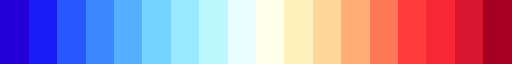

In [3]:
import matplotlib.pyplot as plt


import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import matplotlib.ticker as mticker
import xarray as xr
import numpy as np
import pandas  as pd
import os

from mpl_toolkits.axes_grid1 import make_axes_locatable

import cmaps
import gsw

# blue dark red 18
cmp = cmaps.BlueDarkRed18
cmp

In [6]:
root = "/kaggle/input/wrf-tc-sundarban/d02_including_sundarban/"
pd1 = [root+i for i in os.listdir(root)]

pd1.sort()

root = "/kaggle/input/wrf-tc-sundarban/TC_excluding_Sundarban/"

pd2 = [root+i for i in os.listdir(root)]

pd2.sort()


In [7]:
pd1[0],pd2[0]

('/kaggle/input/wrf-tc-sundarban/d02_including_sundarban/wrfout_d02_2024-05-24_00',
 '/kaggle/input/wrf-tc-sundarban/TC_excluding_Sundarban/wrfout_d02_2024-05-24_00')

In [8]:
dt = xr.open_dataset(pd1[0])
dt1 = xr.open_dataset(pd2[0])
dt1

<xarray.Dataset> Size: 147MB
Dimensions:                (Time: 1, south_north: 188, west_east: 188,
                            bottom_top: 44, bottom_top_stag: 45,
                            soil_layers_stag: 4, west_east_stag: 189,
                            south_north_stag: 189, seed_dim_stag: 8)
Coordinates:
    XLAT                   (Time, south_north, west_east) float32 141kB ...
    XLONG                  (Time, south_north, west_east) float32 141kB ...
    XTIME                  (Time) datetime64[ns] 8B ...
    XLAT_U                 (Time, south_north, west_east_stag) float32 142kB ...
    XLONG_U                (Time, south_north, west_east_stag) float32 142kB ...
    XLAT_V                 (Time, south_north_stag, west_east) float32 142kB ...
    XLONG_V                (Time, south_north_stag, west_east) float32 142kB ...
Dimensions without coordinates: Time, south_north, west_east, bottom_top,
                                bottom_top_stag, soil_layers_stag,
                                west_east_stag, south_north_stag, seed_dim_stag
Data variables: (12/172)
    Times                  (Time) |S19 19B ...
    LU_INDEX               (Time, south_north, west_east) float32 141kB ...
    ZNU                    (Time, bottom_top) float32 176B ...
    ZNW                    (Time, bottom_top_stag) float32 180B ...
    ZS                     (Time, soil_layers_stag) float32 16B ...
    DZS                    (Time, soil_layers_stag) float32 16B ...
    ...                     ...
    PCB                    (Time, south_north, west_east) float32 141kB ...
    PC                     (Time, south_north, west_east) float32 141kB ...
    LANDMASK               (Time, south_north, west_east) float32 141kB ...
    LAKEMASK               (Time, south_north, west_east) float32 141kB ...
    SST                    (Time, south_north, west_east) float32 141kB ...
    SST_INPUT              (Time, south_north, west_east) float32 141kB ...
Attributes: (12/134)
    TITLE:                            OUTPUT FROM WRF V4.4 MODEL
    START_DATE:                      2024-05-24_00:00:00
    SIMULATION_START_DATE:           2024-05-24_00:00:00
    WEST-EAST_GRID_DIMENSION:        189
    SOUTH-NORTH_GRID_DIMENSION:      189
    BOTTOM-TOP_GRID_DIMENSION:       45
    ...                              ...
    ISLAKE:                          21
    ISICE:                           15
    ISURBAN:                         13
    ISOILWATER:                      14
    HYBRID_OPT:                      2
    ETAC:                            0.2

In [11]:
dt.XLONG.values==dt1.XLONG.values, dt.XLAT.values==dt1.XLAT.values

(array([[[ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True],
         ...,
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True]]]),
 array([[[ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True],
         ...,
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True]]]))

(1, 75, 75)

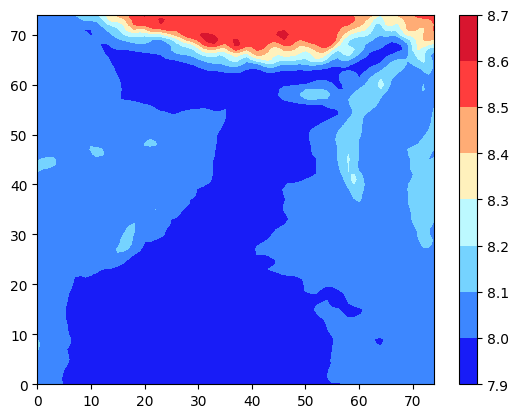

In [21]:
m = plt.contourf(0.001*(dt.PH.values[0,30,:,:]+dt.PHB.values[0,30,:,:])/9.81, cmap= cmp)
plt.colorbar(m)

dt.HGT.values.shape

In [32]:
lon, lat = dt.XLONG.values[0,:,:], dt.XLAT.values[0,:,:]

temp = dt.T.values[0,0,:,:]



def verify_center(dt,time):

    print(str(time)+"\n")

    data =  dt.P.values[0,0,:,:]

    min1in = [list(i).index(np.nanmin(i)) for i in data]

    min1 = [np.nanmin(i) for i in data]

    min2in = min1.index(min(min1))

    min_ = [min2in,min1in[min2in]]


    m = plt.contourf(lon, lat, data, 
                     cmap = cmp, 
                     levels = np.linspace(np.nanmin(data),np.nanmax(data),50))
    plt.scatter(lon[min_[0],min_[1]],
                lat[min_[0],min_[1]],c = "red")
    plt.colorbar(m)
    plt.show()
    

In [ ]:
#[verify_center(xr.open_dataset(pd01[i]),i) for i in range(len(pd01))]

In [34]:

lon, lat = dt.XLONG.values[0,:,:], dt.XLAT.values[0,:,:]



def centerList(dt):
    
    data =  dt.P.values[0,0,:,:]/100

    min1in = [list(i).index(np.nanmin(i)) for i in data]

    min1 = [np.nanmin(i) for i in data]

    min2in = min1.index(min(min1))

    lon_ = lon[min2in,min1in[min2in]]
    lat_ = lat[min2in,min1in[min2in]]
    min_ = data[min2in,min1in[min2in]]

    return lon_,lat_,min_



In [37]:
centers = [centerList(xr.open_dataset(i)) for i in pd1]

lonC = np.array([i[0] for i in centers])
latC = np.array([i[1] for i in centers])
center = np.array([i[2] for i in centers])


def track_file(lon,lat,center,expName="IncludingSundarban"):
    df = pd.DataFrame({"lon":lon,
                        "lat":lat,
                        "center":center})

    df.to_csv("/kaggle/working/track"+expName+".csv",index=False)
    return df 

obj = track_file(lonC,latC,center)
print(obj)

centers = [centerList(xr.open_dataset(i)) for i in pd2]

lonC = np.array([i[0] for i in centers])
latC = np.array([i[1] for i in centers])
center = np.array([i[2] for i in centers])

track_file(lonC,latC,center,expName="ExcludingSundarban")


          lon        lat     center
0   88.965698  14.452873  -3.747500
1   90.097099  15.545715  -5.801562
2   89.468544  15.908722  -8.674844
3   89.719963  16.391724 -10.935938
4   89.594254  16.873520 -16.490860
5   89.594254  17.713707 -24.428282
6   89.342827  18.192078 -36.175938
7   89.594254  18.788170 -46.513046
8   89.719963  19.974014 -52.676014
9   89.971382  20.916344 -56.229923
10  90.097099  21.852776 -56.101875
11  90.348518  22.783119 -45.954689
12  90.725655  23.361397 -37.188908
13  91.479919  24.166748 -28.133827
14  92.108475  24.624695 -22.243437
15  93.114159  24.853043 -11.975156
16  95.251244  25.194771 -10.268594


,lon,lat,center
0,88.965698,14.452873,-3.747500
1,90.097099,15.545715,-5.784844
2,89.468544,16.029587,-8.623047
3,89.845673,16.512283,-10.918828
4,89.719963,16.993782,-16.494375
5,89.594254,17.593925,-24.231562
6,89.342827,18.192078,-36.238594
7,89.468544,18.907150,-46.697655
8,89.594254,19.974014,-53.018360
9,89.845673,20.916344,-54.914764


In [78]:


output = "/kaggle/working/"

from matplotlib import gridspec
import cartopy.io.img_tiles as cimgt


def track(lon1,lat1,percent1,lon2,lat2,percent2,\
          extent=[85.2,93.8,15.7,25.5]):
    
    
    plt.style.use('ggplot')
    plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
    plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True

    #request =  cimgt.GoogleTiles(style = "street")

    fig, ax = plt.subplots(figsize=(24, 12), 
                       subplot_kw={'projection': ccrs.PlateCarree()})

    lon0_ = extent[0]
    lon1_ = extent[1]
    lat0_ = extent[2]
    lat1_ = extent[3]
    ax.set_extent( [lon0_,lon1_,lat0_,lat1_],crs = ccrs.PlateCarree())
    #ax.add_image(request, 6, interpolation='bicubic')

    #ax.add_feature(cfeature.LAND, color = 'lightgray', alpha = 0.5)
    ax.add_feature(cfeature.COASTLINE, color = 'k', linewidth = 1)
    ax.add_feature(cfeature.BORDERS, color = 'k', linewidth = 1)
    #ax.add_feature(cfeature.RIVERS, color = "lightblue",linewidth = 2)
    #ax.add_feature(cfeature.OCEAN, color = "lightblue")
      
    gl = ax.gridlines()
    gl.top_labels = False
    gl.xlines = False
    gl.ylines = False
    gl.bottom_labels = True
    gl.left_labels = True
        

    gl.xlocator = mticker.FixedLocator([np.round(i,1)
                                        for i in np.linspace(lon0_,lon1_,8)])
    gl.ylocator = mticker.FixedLocator([np.round(i,1)
                                        for i in np.linspace(lat0_,lat1_,8)])
        
    gl.xlabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}
    gl.ylabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}

    ax.scatter(lon1,lat1,c = "red", s = 150)
    ax.plot(lon1,lat1,c="red", linewidth = 5, label = "TC Including Sundarban")
    ax.scatter(lon2,lat2,c = "blue", s = 150)
    ax.plot(lon2,lat2,c="blue", linewidth = 5, label = "TC Excluding Sundarban")
    ax.legend(loc='best',
              facecolor = "white",fontsize = 20)

    dates = ["Day: 24 Hour: 18","Day: 25 Hour: 00",
            "Day: 25 Hour: 06","Day: 25 Hour: 12",
             "Day: 25 Hour: 18","Day: 26 Hour: 00","Day: 26 Hour: 06",
            "Day: 26 Hour: 12","Day: 26 Hour: 18","Day: 27 Hour: 00",
            "Day: 27 Hour: 12","Day: 27 Hour: 18","Day: 27 Hour: 18",
            "Day: 28 Hour: 00",]

    
    s = 0
    for (i, j) in zip(lon1,lat1):

        if s>=0:
            
            plt.text(i+1.5, j, "Distance: "+str(percent1[s])+"NM "+dates[s],
                 
                     color='red',fontsize = 18,fontweight = "bold"
                    ) #bbox=dict(facecolor='white')
        else:
            plt.text(i+1.5, j, dates[s],
                 
                     color='red',fontsize = 18,fontweight = 'bold'
                    ) #bbox=dict(facecolor='white')
        
        s+=1

    s = 0
    
    for (i, j) in zip(lon2,lat2):

        if s>=0:
            plt.text(i-5, j, "Distance: "+str(percent2[s])+"NM",
                     color='blue',fontsize = 18,fontweight = 'bold'
                     ) #bbox=dict(facecolor='white')
            
        s+=1

    #plt.title("TC Remal Track",fontsize = 20, fontweight = "bold",fontname = "Times New Roman")
    plt.savefig("/kaggle/working/track.jpg")

    plt.show()


In [59]:
import datetime

tcv_ = pd.read_csv("/kaggle/input/validation-track-remal/zoom_earth_TC_Remal_track2.csv")

tc1 = pd.read_csv("/kaggle/working/trackIncludingSundarban.csv")
tc2 = pd.read_csv("/kaggle/working/trackExcludingSundarban.csv")

date = np.hstack([np.array([str(datetime.datetime(2024,5,j,i)) for i in range(0,24,6)])\
                  for j in range(24,29)])[:-3]

tc1["date"] = date
tc2["date"] = date

def create_track_validation(tcv_,tc1,tc2):

    tcv = tcv_.copy()
    day,hour = tcv.day.values,tcv.hour.values

    tcv["date"]=[str(datetime.datetime(2024,5,int(day[i]),int(hour[i][:2])))\
                 for i in range(len(day))]


    tcv.drop(["day","hour"],axis = 1, inplace = True)


    date = list(tcv.date.values[-13:])

    date.sort()

    tc1_ = pd.concat([tc1[tc1.date.values==i] for i in date])

    tc2_ = pd.concat([tc2[tc2.date.values==i] for i in date])

    tcv_ = pd.concat([tcv[tcv.date.values==i] for i in date])
   
    """dis1 = gsw.geostrophy.distance(tc1_.lon.values, tc1_.lat.values)/1000   # lon,lat
    dis2 = gsw.geostrophy.distance(tc2_.lon.values, tc2_.lat.values)/1000   # lon,lat
    dis3 = gsw.geostrophy.distance(tcv_.lon.values, tcv_.lat.values)/1000   # lon,lat

    
    percent1 = np.abs(dis1-dis3)/dis3
    percent2 = np.abs(dis2-dis3)/dis3

    percent1_ = list(percent1)
    percent1_.insert(0,0)
    percent1 = np.array(percent1_)*100

    percent2_ = list(percent2)
    percent2_.insert(0,0)
    percent2 = np.array(percent2_)*100

    rmse1 = (sum((dis1-dis3)**2)/len(dis3))**0.5
    rmse2 = (sum((dis2-dis3)**2)/len(dis3))**0.5"""

    dis1 = np.zeros([len(tc1_.lon.values)])
    dis2 = dis1.copy()
    
    for i in range(len(tc1_.lon.values)):
        dis1[i] = (gsw.geostrophy.distance([tc1_.lon.values[i], tcv_.lon.values[i]],\
                                [tc1_.lat.values[i], tcv_.lat.values[i]])/1000)*0.54
        dis2[i] = (gsw.geostrophy.distance([tc2_.lon.values[i], tcv_.lon.values[i]],\
                                [tc2_.lat.values[i], tcv_.lat.values[i]])/1000)*0.54
        
    mean1 = np.nansum(dis1)/len(dis1)
    mean2 = np.nansum(dis2)/len(dis2)

    return tc1_, tc2_, tcv_, mean1, mean2, np.round(dis1,1), np.round(dis2,1)



In [55]:
obj = create_track_validation(tcv_,tc1,tc2)

obj[3:5]

(568.1702384003174, 559.532677742502)

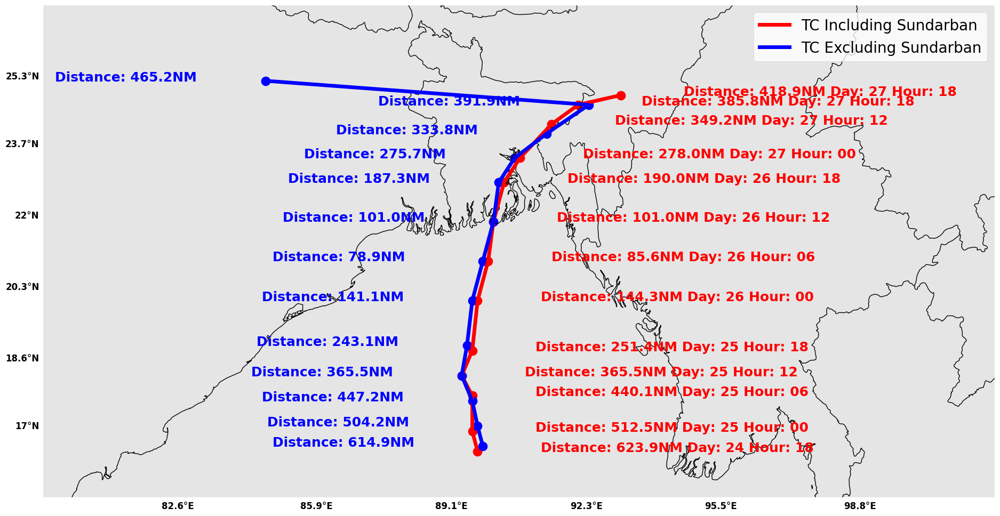

In [80]:
#dt = xr.open_dataset(pd1[0])
lon, lat = dt.XLONG.values[0,:,:], dt.XLAT.values[0,:,:]
x_ = np.linspace(np.min(lon), np.max(lon),75)
y_ = np.linspace(np.min(lat), np.max(lat),75)
x,y = np.meshgrid(x_,y_)


extent = [int(np.nanmin(lon))+3.4,int(np.nanmax(lon))+3,\
          int(np.nanmin(lat))+12.3,int(np.nanmax(lat))+2]

obj = create_track_validation(tcv_,tc1,tc2)
dis1,dis2 = obj[5:]
tc1_, tc2_ = obj[:2]


lon1,lat1 = tc1_.lon.values,tc1_.lat.values
lon2,lat2 = tc2_.lon.values,tc2_.lat.values

track(lon1,lat1,dis1,lon2,lat2,dis2,extent)


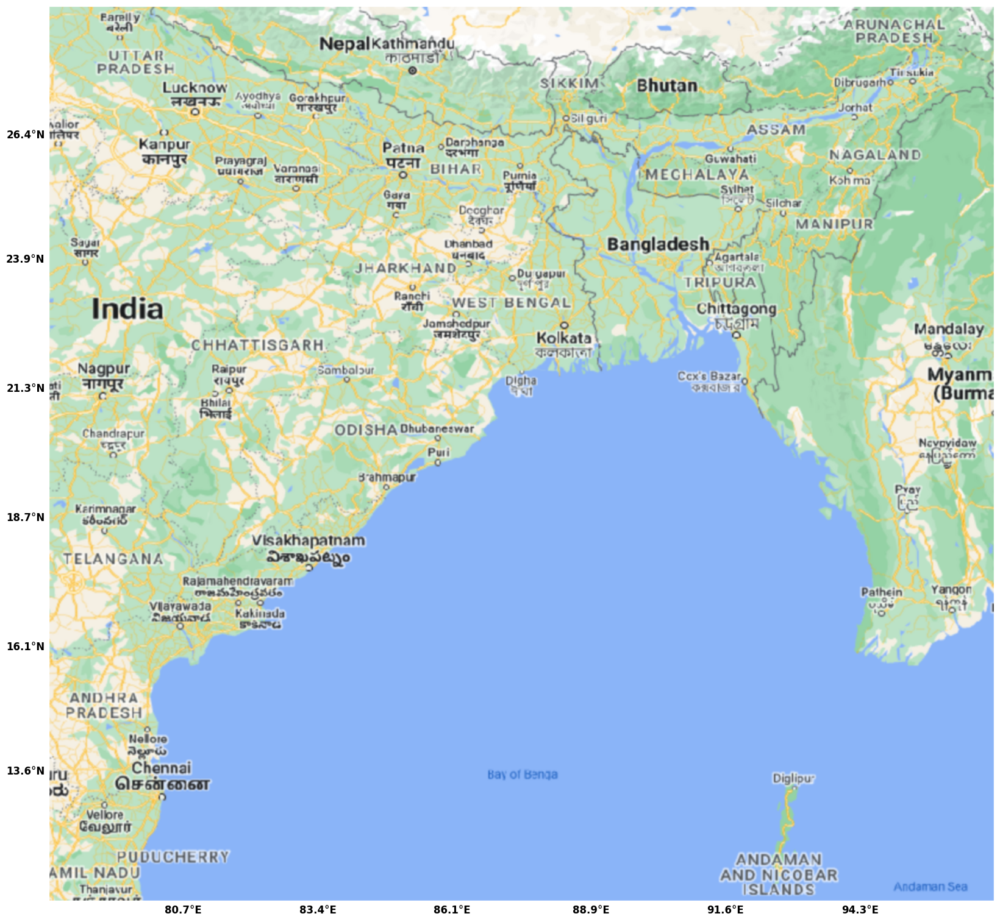

In [6]:
#Simulatin domain



output = "/kaggle/working/"

from matplotlib import gridspec
import cartopy.io.img_tiles as cimgt


def domain_plot(extent):
    
    
    plt.style.use('ggplot')
    plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
    plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True


    #request = cimgt.OSM()

    request =  cimgt.GoogleTiles(style = "street")
    #request =  cimgt.QuadtreeTiles()
    

    

    fig, ax = plt.subplots(figsize=(20, 20), 
                       subplot_kw={'projection': ccrs.PlateCarree()})

    lon0_ = extent[0]
    lon1_ = extent[1]
    lat0_ = extent[2]
    lat1_ = extent[3]
    ax.set_extent( [lon0_,lon1_,lat0_,lat1_],crs = ccrs.PlateCarree())
    ax.add_image(request, 6, interpolation='bicubic')

    """ax.add_feature(cfeature.LAND, color = 'lightgray', alpha = 0.5)
    ax.add_feature(cfeature.COASTLINE, color = 'k', linewidth = 2)
    ax.add_feature(cfeature.BORDERS, color = 'k', linewidth = 1)
    #ax.add_feature(cfeature.RIVERS, color = "lightblue",linewidth = 2)
    ax.add_feature(cfeature.OCEAN, color = "lightblue")"""
      
    gl = ax.gridlines()
    gl.top_labels = False
    gl.xlines = False
    gl.ylines = False
    gl.bottom_labels = True
    gl.left_labels = True
        

    gl.xlocator = mticker.FixedLocator([np.round(i,1)
                                        for i in np.linspace(lon0_,lon1_,8)])
    gl.ylocator = mticker.FixedLocator([np.round(i,1)
                                        for i in np.linspace(lat0_,lat1_,8)])
        
    gl.xlabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}
    gl.ylabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}

     
    plt.savefig("/kaggle/working/study_domain.jpg")

    plt.show()


dt = xr.open_dataset(pd01[0])
lon, lat = dt.XLONG.values[0,:,:], dt.XLAT.values[0,:,:]



extent = [int(np.nanmin(lon)),int(np.nanmax(lon)),\
          int(np.nanmin(lat)),int(np.nanmax(lat))]


domain_plot(extent)




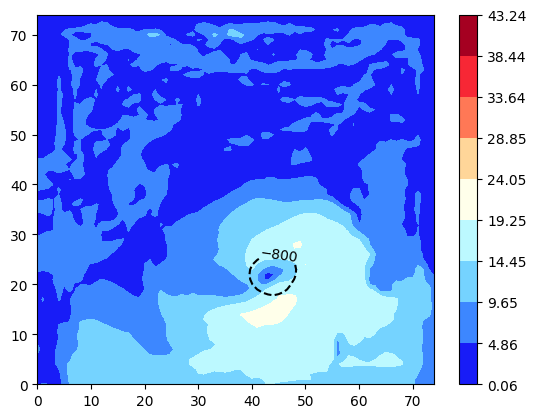

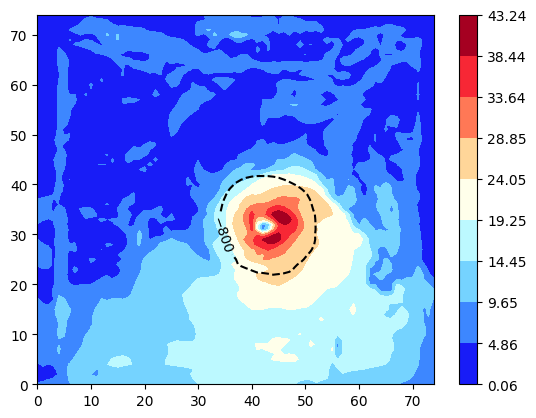

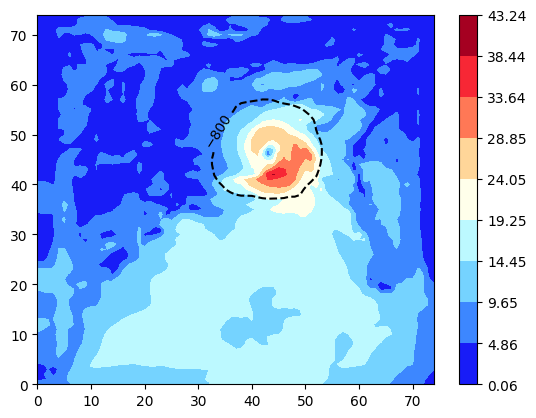

In [4]:
# Unnecessary

dt1,dt2,dt3 = xr.open_dataset(pd01[18]),xr.open_dataset(pd01[18+24]),xr.open_dataset(pd01[18+48])

dt_ = [dt1,dt2,dt3]

minP = np.nanmin(np.array([dt1.P.values,dt2.P.values,dt3.P.values]))

vel = []
for t in range(3):
    vel_ = []
    for i in ["U","V","W"]:
        vel_.append((dt_[t][i].values[0,0,:75,:75])**2)
    vel_ = np.nansum(vel_,axis = 0)**0.5
    vel.append(vel_)
    
temp = np.array([dt1.T.values[0,0,:,:],dt2.T.values[0,0,:,:],dt3.T.values[0,0,:,:]])

data = vel.copy()

for i in range(3):
    plt.clabel(plt.contour(dt_[i].P.values[0,0,:,:],
                 vmax = -600,vmin = minP,colors = "k",
                levels = np.linspace(minP,-800,2)))
    m = plt.contourf(data[i],
                 vmax = np.nanmax(data),vmin = np.nanmin(data),cmap=cmp,
                levels = np.linspace(np.nanmin(data),np.nanmax(data),10))
    plt.colorbar(m)
   

    plt.show()

In [67]:
# unnecessary

dtw = xr.open_dataset(pd01[1])

dtw.HGT.values.shape

(1, 75, 75)

In [11]:
# unnecessary

for n in range(2,74):
    if not np.round(lon[0][n]-lon[0][n-1],3)==np.round(lon[0][n+1]-lon[0][n],3):
        print(n,"lon",False)
        

for n in range(2,74):
    if not np.round(lat[n][0]-lat[n-1][0],3)==np.round(lat[n+1][0]-lat[n][0],3):
        print(n,"lat",False,np.round(lat[n][0]-lat[n-1][0],3),np.round(lat[n+1][0]-lat[n][0],3))

n = 50
np.round(lon[0][n]-lon[0][n-1],3),np.round(lat[n][0]-lat[n-1][0],2)

3 lat False 0.254 0.253
7 lat False 0.253 0.252
11 lat False 0.252 0.251
14 lat False 0.251 0.25
18 lat False 0.25 0.249
21 lat False 0.249 0.248
24 lat False 0.248 0.247
27 lat False 0.247 0.246
30 lat False 0.246 0.245
33 lat False 0.245 0.244
35 lat False 0.244 0.243
38 lat False 0.243 0.242
40 lat False 0.242 0.241
43 lat False 0.241 0.24
45 lat False 0.24 0.239
48 lat False 0.239 0.238
50 lat False 0.238 0.237
52 lat False 0.237 0.236
55 lat False 0.236 0.235
57 lat False 0.235 0.234
59 lat False 0.234 0.233
61 lat False 0.233 0.232
63 lat False 0.232 0.231
65 lat False 0.231 0.23
68 lat False 0.23 0.229
70 lat False 0.229 0.228
72 lat False 0.228 0.227


(0.259, 0.24)

In [9]:



def centerRList(pres):
    
    min1in = [list(i).index(np.nanmin(i)) for i in pres]

    min1 = [np.nanmin(i) for i in pres]

    min2in = min1.index(min(min1))

    return min1in,min2in



In [8]:
dt

<xarray.Dataset> Size: 147MB
Dimensions:                (Time: 1, south_north: 188, west_east: 188,
                            bottom_top: 44, bottom_top_stag: 45,
                            soil_layers_stag: 4, west_east_stag: 189,
                            south_north_stag: 189, seed_dim_stag: 8)
Coordinates:
    XLAT                   (Time, south_north, west_east) float32 141kB ...
    XLONG                  (Time, south_north, west_east) float32 141kB ...
    XTIME                  (Time) datetime64[ns] 8B ...
    XLAT_U                 (Time, south_north, west_east_stag) float32 142kB ...
    XLONG_U                (Time, south_north, west_east_stag) float32 142kB ...
    XLAT_V                 (Time, south_north_stag, west_east) float32 142kB ...
    XLONG_V                (Time, south_north_stag, west_east) float32 142kB ...
Dimensions without coordinates: Time, south_north, west_east, bottom_top,
                                bottom_top_stag, soil_layers_stag,
                                west_east_stag, south_north_stag, seed_dim_stag
Data variables: (12/172)
    Times                  (Time) |S19 19B ...
    LU_INDEX               (Time, south_north, west_east) float32 141kB ...
    ZNU                    (Time, bottom_top) float32 176B ...
    ZNW                    (Time, bottom_top_stag) float32 180B ...
    ZS                     (Time, soil_layers_stag) float32 16B ...
    DZS                    (Time, soil_layers_stag) float32 16B ...
    ...                     ...
    PCB                    (Time, south_north, west_east) float32 141kB ...
    PC                     (Time, south_north, west_east) float32 141kB ...
    LANDMASK               (Time, south_north, west_east) float32 141kB ...
    LAKEMASK               (Time, south_north, west_east) float32 141kB ...
    SST                    (Time, south_north, west_east) float32 141kB ...
    SST_INPUT              (Time, south_north, west_east) float32 141kB ...
Attributes: (12/134)
    TITLE:                            OUTPUT FROM WRF V4.4 MODEL
    START_DATE:                      2024-05-24_00:00:00
    SIMULATION_START_DATE:           2024-05-24_00:00:00
    WEST-EAST_GRID_DIMENSION:        189
    SOUTH-NORTH_GRID_DIMENSION:      189
    BOTTOM-TOP_GRID_DIMENSION:       45
    ...                              ...
    ISLAKE:                          21
    ISICE:                           15
    ISURBAN:                         13
    ISOILWATER:                      14
    HYBRID_OPT:                      2
    ETAC:                            0.2

In [10]:
# File name: pd01:0.5, pd11:1
# create lonIndex and latIndex using min1in and min2in

def ana1read(path, l=0):
    dt = xr.open_dataset(path)
    u,v = dt.U.values[0,l,:188,:188],dt.V.values[0,l,:188,:188]

    vel = (u**2+v**2)**0.5

    temp = dt.T.values[0,l,:,:]
    pres = dt.P.values[0,l,:,:]  # Early version: dt.P.values[0,l,:,:]

    

    min1in,min2in = centerRList(pres)
    
    maxVel = np.nanmax(vel[min2in-2:min2in+2,min1in[min2in]-2:min1in[min2in]+2])
    maxTemp = np.nanmax(temp[min2in-2:min2in+2,min1in[min2in]-2:min1in[min2in]+2])
    minPres = np.nanmin(pres[min2in-2:min2in+2,min1in[min2in]-2:min1in[min2in]+2])/100

    # Early version: maxPres = np.nanmax(pres[min2in-2:min2in+2,min1in[min2in]-2:min1in[min2in]+2])/100

    lon_ = dt.XLONG.values[0,min2in,min1in[min2in]]
    lat_ = dt.XLAT.values[0,min2in,min1in[min2in]]

    latIndex = min2in
    lonIndex = min1in[min2in]

    return maxVel,maxTemp,minPres, lon_, lat_,lonIndex,latIndex



In [11]:
from datetime import datetime as date

dates = np.hstack([np.array([str(date(2024,5,d,h))\
                             for h in range(0,24,6)]) for d in [24,25,26,27,28]])
dates = dates[:-3]

#dt = xr.open_dataset(pd1[0])

lon, lat = dt.XLONG.values[0,:,:], dt.XLAT.values[0,:,:]



# tc_half, tc_1
# vel, pres, temp

def formCSVAnalysis1(layer):
    
    ana1d1 = [ana1read(i,layer) for i in pd1]

    vel = np.array([i[0] for i in ana1d1])
    temp = np.array([i[1] for i in ana1d1])
    pres = np.array([i[2] for i in ana1d1])
    lon_ = np.array([i[3] for i in ana1d1])
    lat_ = np.array([i[4] for i in ana1d1])
    lonIndex_ = np.array([i[5] for i in ana1d1])
    latIndex_ = np.array([i[6] for i in ana1d1])

    ana1d2 = [ana1read(i,layer) for i in pd2]

    vel2 = np.array([i[0] for i in ana1d2])
    temp2 = np.array([i[1] for i in ana1d2])
    pres2 = np.array([i[2] for i in ana1d2])
    lon2_ = np.array([i[3] for i in ana1d2])
    lat2_ = np.array([i[4] for i in ana1d2])
    lonIndex2_ = np.array([i[5] for i in ana1d2])
    latIndex2_ = np.array([i[6] for i in ana1d2])

    tc_1 = dict()

    if layer in [0,"0"]:
        lb = ""
    else:
        lb = "_"+str(layer)

    tc_1["max_wind"+lb] = vel
    tc_1["temperature"+lb] = temp
    tc_1["min_pressure"+lb] = pres
    tc_1["lon"+lb] = lon_
    tc_1["lat"+lb] = lat_
    tc_1["lonIndex"+lb] = lonIndex_
    tc_1["latIndex"+lb] = latIndex_

    tc_1 = pd.DataFrame(tc_1)

    tc_2 = dict()
    
    tc_2["max_wind"+lb] = vel2
    tc_2["temperature"+lb] = temp2
    tc_2["min_pressure"+lb] = pres2
    tc_2["lon"+lb] = lon2_
    tc_2["lat"+lb] = lat2_
    tc_2["lonIndex"+lb] = lonIndex2_
    tc_2["latIndex"+lb] = latIndex2_

    tc_2 = pd.DataFrame(tc_2)


    return tc_1,tc_2

# Early version: for i in range(0,31,10):tc_half, tc_1 = formCSVAnalysis1(i,tc_half,tc_1)

tc_1, tc_2 = formCSVAnalysis1(0)

tc_1["date"] = dates
tc_2["date"] = dates

tc_1.to_csv("/kaggle/working/tc_1_max_wind.csv", index = False)

tc_2.to_csv("/kaggle/working/tc_2_max_wind.csv", index = False)

pd.read_csv("/kaggle/working/tc_1_max_wind.csv")

,max_wind,temperature,min_pressure,lon,lat,lonIndex,latIndex,date
0,11.734365,2.290588,-3.747500,88.965700,14.452873,101,92,2024-05-24 00:00:00
1,10.082622,3.696137,-5.801563,90.097100,15.545715,110,101,2024-05-24 06:00:00
2,8.391520,3.612763,-8.674844,89.468544,15.908722,105,104,2024-05-24 12:00:00
3,7.647220,3.802307,-10.935937,89.719960,16.391724,107,108,2024-05-24 18:00:00
4,13.705759,4.892792,-16.490859,89.594250,16.873520,106,112,2024-05-25 00:00:00
5,14.741839,5.422058,-24.428281,89.594250,17.713707,106,119,2024-05-25 06:00:00
6,16.849857,6.617676,-36.175938,89.342830,18.192078,104,123,2024-05-25 12:00:00
7,43.947914,7.383545,-46.513047,89.594250,18.788170,106,128,2024-05-25 18:00:00
8,27.433357,8.460785,-52.676016,89.719960,19.974014,107,138,2024-05-26 00:00:00
9,30.910542,8.962097,-56.229922,89.971380,20.916344,109,146,2024-05-26 06:00:00


In [12]:
pd.read_csv("/kaggle/working/tc_2_max_wind.csv")

,max_wind,temperature,min_pressure,lon,lat,lonIndex,latIndex,date
0,11.734365,2.290588,-3.747500,88.965700,14.452873,101,92,2024-05-24 00:00:00
1,9.761782,3.683044,-5.784844,90.097100,15.545715,110,101,2024-05-24 06:00:00
2,7.099338,3.722321,-8.623047,89.468544,16.029587,105,105,2024-05-24 12:00:00
3,7.983030,4.155212,-10.918828,89.845670,16.512283,108,109,2024-05-24 18:00:00
4,13.786951,4.860504,-16.494375,89.719960,16.993782,107,113,2024-05-25 00:00:00
5,16.307945,5.702331,-24.231562,89.594250,17.593925,106,118,2024-05-25 06:00:00
6,15.880430,6.342224,-36.238594,89.342830,18.192078,104,123,2024-05-25 12:00:00
7,28.024677,7.350006,-46.697656,89.468544,18.907150,105,129,2024-05-25 18:00:00
8,42.124200,8.288147,-53.018359,89.594250,19.974014,106,138,2024-05-26 00:00:00
9,30.355625,8.724976,-54.914766,89.845670,20.916344,108,146,2024-05-26 06:00:00


In [13]:
tcv = pd.read_csv("/kaggle/input/validation-track-remal/zoom_earth_TC_Remal_track2.csv")

tc_1 = pd.read_csv("/kaggle/working/tc_1_max_wind.csv")
tc_2 = pd.read_csv("/kaggle/working/tc_2_max_wind.csv")

import datetime

def create_track_validation(tcv,tc1,tc2):
    day,hour = tcv.day.values,tcv.hour.values

    tcv["date"]=[str(datetime.datetime(2024,5,int(day[i]),int(hour[i][:2])))\
                 for i in range(len(day))]


    tcv.drop(["day","hour"],axis = 1, inplace = True)


    date = list(tcv.date.values[-14:])

    date.sort()

    tc1_ = pd.concat([tc1[tc1.date.values==i] for i in date])

    tc2_ = pd.concat([tc2[tc2.date.values==i] for i in date])
    
    tcv_ = pd.concat([tcv[tcv.date.values==i] for i in date])

    tcv_["max_wind"] = tcv_.wind.values

    percent1 = np.round((abs(((tc1_.max_wind.values*3600)/1000)*\
             0.54-tcv_.wind.values*0.54)/tcv_.wind.values*0.54)*100,1)

    percent2 = np.round((abs(((tc2_.max_wind.values*3600)/1000)*\
             0.54-tcv_.wind.values*0.54)/tcv_.wind.values*0.54)*100,1)

    rmse1 = (np.nansum((((tc1_.max_wind.values*3600)/1000)*\
             0.54-tcv_.wind.values*0.54)**2)/len(tcv_.wind.values))**0.5

    rmse2 = (np.nansum((((tc2_.max_wind.values*3600)/1000)*\
             0.54-tcv_.wind.values*0.54)**2)/len(tcv_.wind.values))**0.5

    return tc1_, tc2_, percent1, percent2, rmse1,rmse2


# tc1 = tc_half, tc2 = tc_1
obj = create_track_validation(tcv,tc_1,tc_2)
obj[4:]

(76.29535004760187, 74.0046306748616)

In [101]:
len(data[0])

13

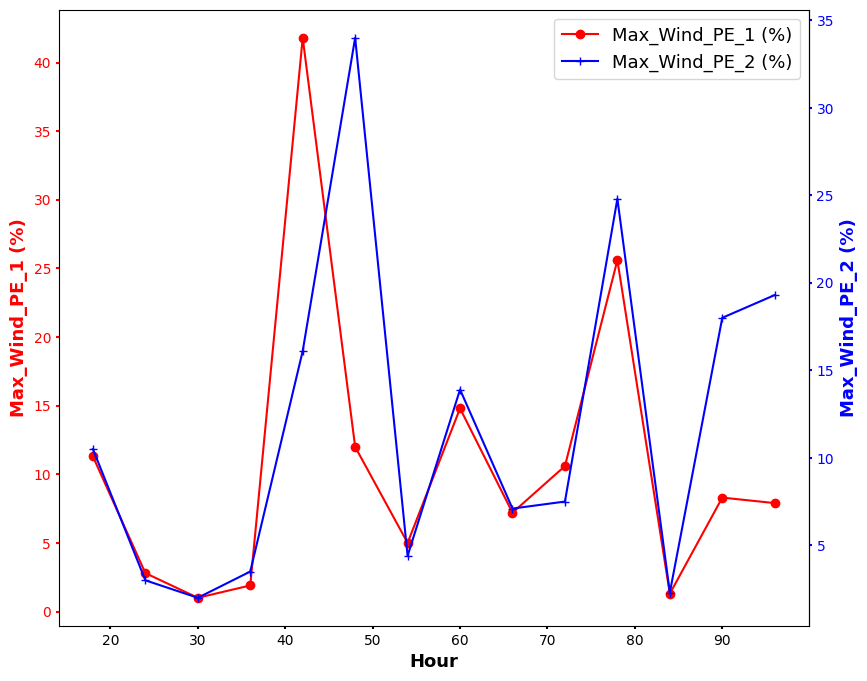

In [110]:
# maxuimum sustained wind plot
data = np.array(obj[2:4]).copy()  #PE of tc_half and tc_1 respectively


import matplotlib.pyplot as plt

def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)


def multiScaleLine(data, labels = ["Max_Wind_PE_1 (%)","Max_Wind_PE_2 (%)"],\
                   fnt = 13, anchor = 1.26, title = "analysis1_correction"):
    
    plt.style.use('default')

    fig, ax1 = plt.subplots(figsize = (12,8))
    fig.subplots_adjust(right=0.75)

    ax2 = ax1.twinx()

    if len(data[0])==14:
        x = np.arange(18,97,6)
    else:
        x = np.arange(0,97,6)
    
    ax1.set_xlabel('Hour', fontweight = "bold", fontsize = fnt)
    ax1.set_ylabel(labels[0], fontweight = "bold", c = 'red', fontsize = fnt)
    p1,  = ax1.plot(x,data[0], color = 'red', label = labels[0], marker = "o")

    ax2.set_ylabel(labels[1], fontweight = "bold", c = 'blue', fontsize = fnt)
    p2, = ax2.plot(x,data[1],color = 'blue', label = labels[1], marker = "+")


    ax2.spines["right"].set_position(("axes", anchor))

    make_patch_spines_invisible(ax2)

    ax2.spines["right"].set_visible(True)


    tkw = dict(size=2, width=1.5)
    ax1.tick_params(axis='y', colors=p1.get_color(), **tkw)
    ax2.tick_params(axis='y', colors=p2.get_color(), **tkw)
    ax1.tick_params(axis='x', **tkw)

    lines = [p1, p2]

    ax1.legend(lines, [l.get_label() for l in lines], loc = "best",
           #bbox_to_anchor = (anchor+0.4,1), 
           
           facecolor = 'w', fontsize = fnt)
 
    plt.xlabel("Time", fontweight = "bold", fontsize = fnt)
    #plt.tight_layout()

    plt.savefig("/kaggle/working/{}.jpg".format(title))
    plt.show()

multiScaleLine(data, anchor = 1)


In [107]:
len(data[0])

17

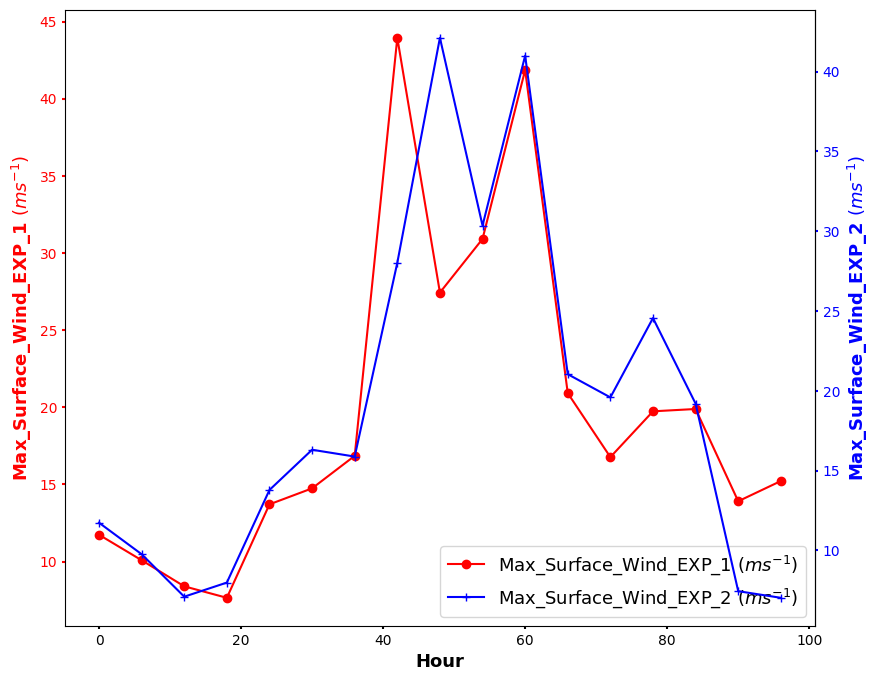

In [111]:
#tc_half = pd.read_csv("/kaggle/input/tc-including-microphysics/tc_microphysics_half.csv")
#tc_1 = pd.read_csv("/kaggle/input/tc-including-microphysics/tc_microphysics_1.csv")

data = [tc_1.max_wind.values.copy(), tc_2.max_wind.values.copy()]

multiScaleLine(data, labels = ["Max_Surface_Wind_EXP_1 $(ms^{-1})$",
                               "Max_Surface_Wind_EXP_2 $(ms^{-1})$"],\
             anchor = 1, title = "analysis1_correction_wind_plot")

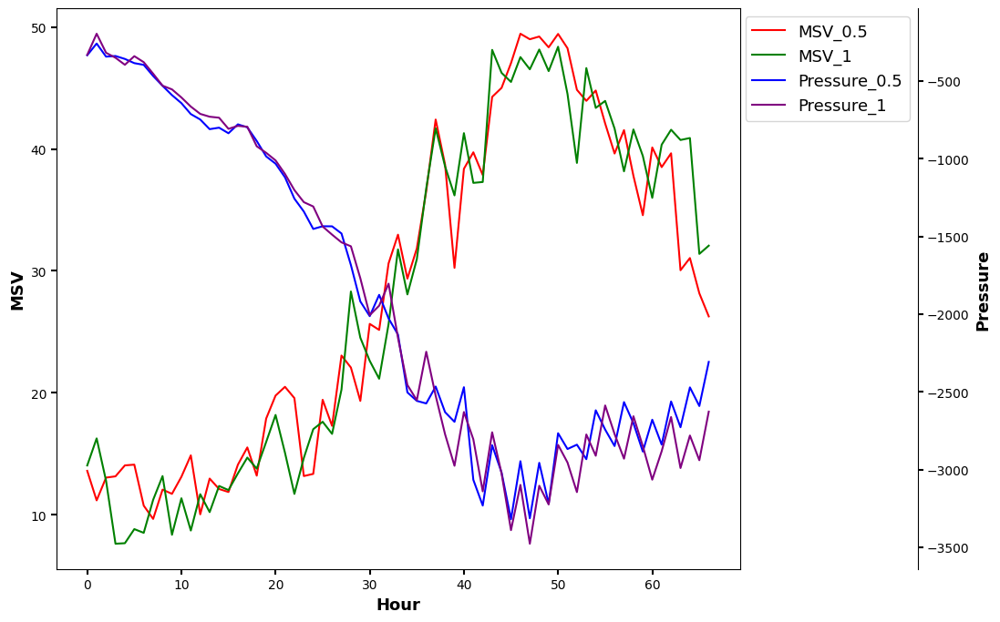

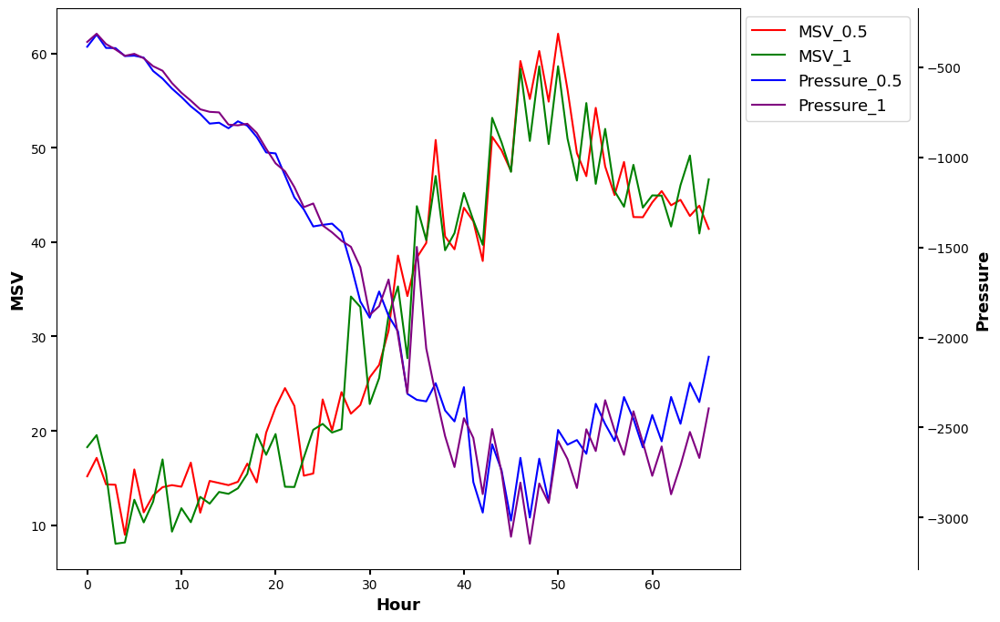

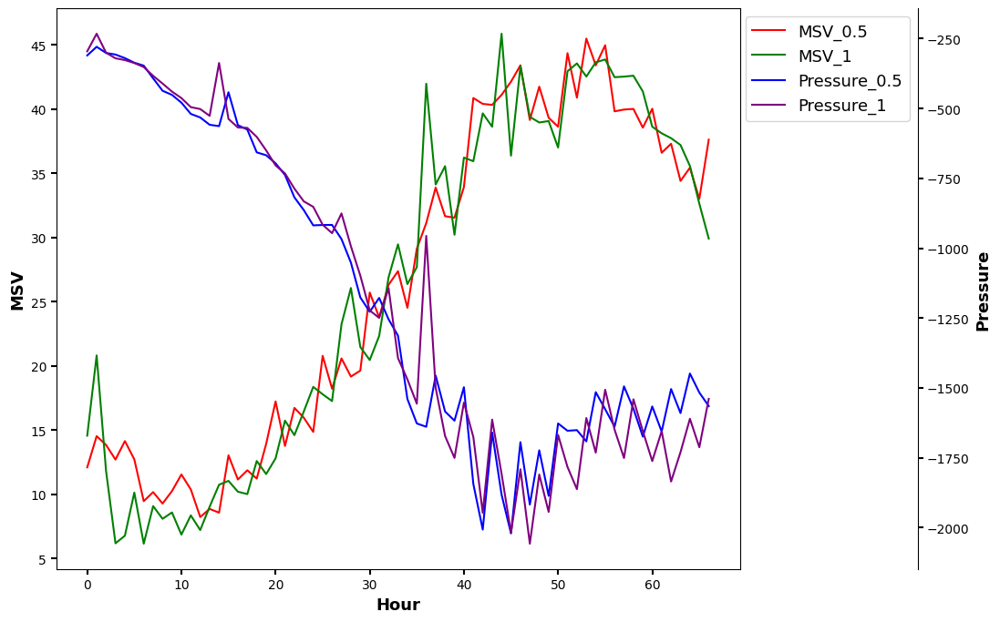

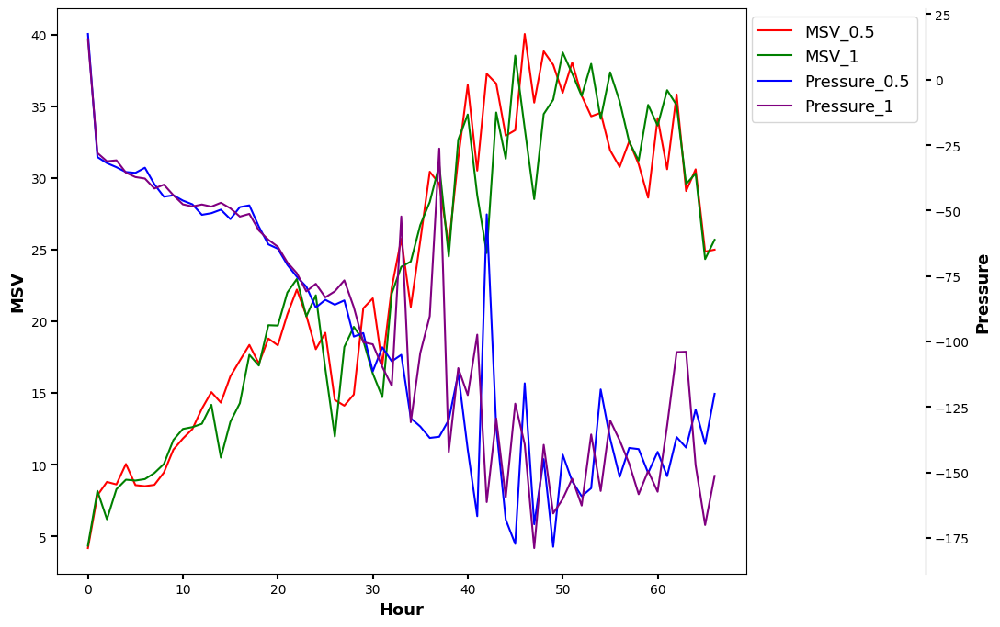

[None, None, None, None]

In [60]:
# MSV = maxuimum sustained velocity
#tc_half = pd.read_csv("/kaggle/input/tc-including-microphysics/tc_microphysics_half.csv")
#tc_1 = pd.read_csv("/kaggle/input/tc-including-microphysics/tc_microphysics_1.csv")

import matplotlib.pyplot as plt

def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)


def multiScaleLine2(layer, fnt = 13, anchor = 1.26):

    data = [tc_half["maximum_sustained_velocity_"+layer].values,
            tc_1["maximum_sustained_velocity_"+layer].values,
            tc_half["pressure_"+layer].values,
            tc_1["pressure_"+layer].values]

    labels = ["MSV_0.5","MSV_1", 
          "Pressure_0.5", "Pressure_1"]
    lbls = ["MSV",'Pressure']

    plt.style.use('default')

    fig, ax1 = plt.subplots(figsize = (12,8))
    fig.subplots_adjust(right=0.75)

    ax2 = ax1.twinx()
    

    ax1.set_xlabel('Hour', fontweight = "bold", fontsize = fnt)
    ax1.set_ylabel(lbls[0], fontweight = "bold", c = 'k', fontsize = fnt)
    p1,  = ax1.plot(data[0], color = 'red', label = labels[0])

    #ax1.set_ylabel(lbls[0], fontweight = "bold", c = 'k', fontsize = fnt)
    p2, = ax1.plot(data[1],color = 'green', label = labels[1])

    ax2.set_ylabel(lbls[1], fontweight = "bold", c = 'k', fontsize = fnt)
    p3, = ax2.plot(data[2],color = 'blue', label = labels[2])

    #ax2.set_ylabel(lbls[1], fontweight = "bold", c = 'k', fontsize = fnt)
    p4, = ax2.plot(data[3],color = 'purple', label = labels[3])

    
    ax2.spines["right"].set_position(("axes", anchor))

    make_patch_spines_invisible(ax2)
    ax2.spines["right"].set_visible(True)
  

    tkw = dict(size=4, width=1.5)
    ax1.tick_params(axis='y', colors='k', **tkw)
    ax2.tick_params(axis='y', colors='k', **tkw)
   
    ax1.tick_params(axis='x', **tkw)

    lines = [p1, p2, p3, p4]

    ax1.legend(lines, [l.get_label() for l in lines], loc = "upper right",
           bbox_to_anchor = (anchor,1), 
           facecolor = 'w', fontsize = fnt)
 
    plt.xlabel("Time", fontweight = "bold", fontsize = fnt)
    #plt.tight_layout()

    plt.savefig("/kaggle/working/analysis1_{}.jpg".format(layer))
    plt.show()

[multiScaleLine2(str(layer)) for layer in range(0,31,10)]


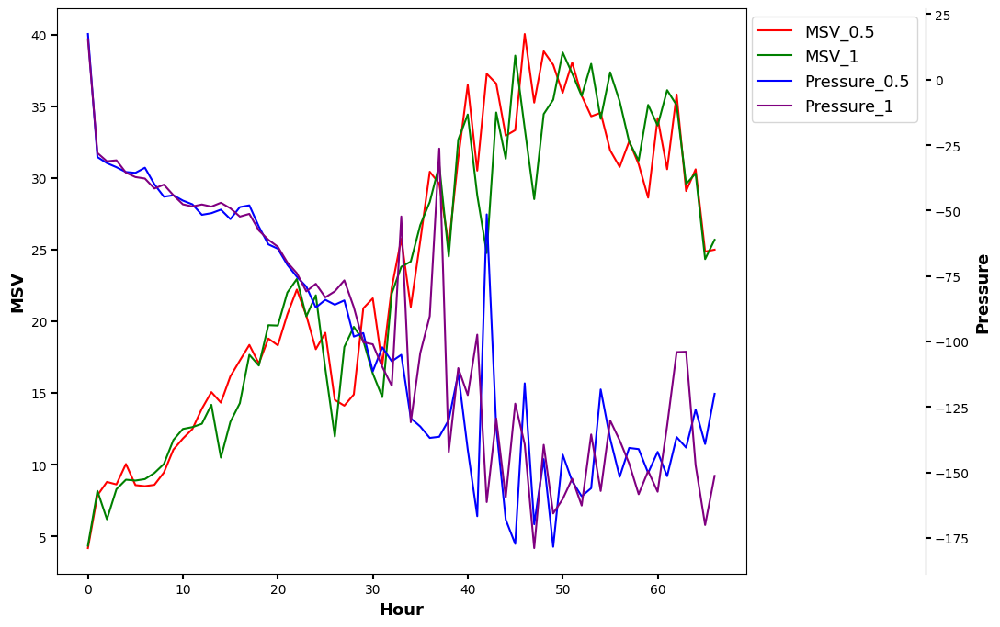

In [65]:
multiScaleLine2(str(30))

In [97]:
stop_execution

NameError: name 'stop_execution' is not defined

# **Analysis 2**

In [90]:



output = "/kaggle/working/"

from matplotlib import gridspec

plt.style.use('ggplot')
plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True

seq_ = [i for i in "11112222"]
s = 0
for i in "abcdefgh":
    seq.append("({})".format(i)+" EXP-"+seq_[s])
    
from datetime import datetime as date

dates = [str(date(2024,5,d,18)) for d in [24,25,26,27]]


def composite(data1,data2,lon,lat,extent,ccolor2,adjust = 0.62,\
              vmin=None,title="Analysis2HeatFlux_Column Integrated Vapor Content",\
              unit= "$(gm kg^{-1})$", ccolor = "red",colormap=cmp,scale1=10,scale2=7):


  vmin1,vmax1 = np.nanmin(data1),np.nanmax(data1)

  vmin2,vmax2 = np.nanmin(data2),np.nanmax(data2)

  nrow = 2
  ncol = 4

  #eName
  fig = plt.figure(figsize=((ncol+1)*4, (nrow+1)*4))



  gs = gridspec.GridSpec(nrow, ncol,wspace=0,
                         hspace=0, top=1.-adjust/(nrow+1), 
                         bottom=adjust/(nrow+1), left=0.15, right=0.85)
  #gs = gridspec.GridSpec(nrow, ncol,wspace=0.0, hspace=0.0, top=1.-0.5/(nrow+1), bottom=0.5/(nrow+1), left=0.5/(ncol+1), right=1-0.5/(ncol+1))


  j = -1
  for i in range(nrow):
    for k in range(ncol):
      j+=1
      ax = plt.subplot(gs[i,k], projection=ccrs.PlateCarree())
      lon1,lon2,lat1,lat2=extent
      ax.set_extent([lon1,lon2,lat1,lat2], ccrs.PlateCarree())
      ax.add_feature(cfeature.COASTLINE, color = 'white', linewidth = 1)
      ax.add_feature(cfeature.BORDERS, color = 'white', linewidth = 1)   
      gl = ax.gridlines()
      gl.top_labels = False
      gl.xlines = False
      gl.ylines = False
      if j in [1,2,3]:
        gl.bottom_labels = False
        gl.left_labels = False
        gl.right_labels =False        
      elif j ==0:
        gl.bottom_labels = False
        gl.left_labels = True
      elif j == 4:
        gl.bottom_labels = True
        gl.left_labels = True
      elif j in [5,6,7]:
        gl.bottom_labels = True
        gl.left_labels = False
        gl.right_labels =False
          
        

          
      gl.xlocator = mticker.FixedLocator(np.arange(lon1,lon2,2.5))
      gl.ylocator = mticker.FixedLocator(np.arange(lat1,lat2,2.5))
        
      gl.xlabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}
      gl.ylabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}
    
      if vmin==None:
          vmin=vmin1
      

      m = ax.contourf(lon, lat,data1[i,k,:,:],cmap = colormap, 
                            transform = ccrs.PlateCarree(),extent = extent,
                            vmin = vmin, vmax = vmax1,
                            levels = np.linspace(vmin, vmax1, scale1))
      plt.clabel(plt.contour(lon,lat,data2[i,k,:,:],colors = ccolor2, 
                             transform = ccrs.PlateCarree(),extent = extent,
                             vmin = vmin2,
                             vmax = vmax2,
                             levels = np.linspace(vmin2,
                                                vmax2,scale2)),
                             fontsize = 16, colors = ccolor)
     
        
  
      ax.text(sum(extent[:2])/2,extent[3]-1,"{}".format(seq[j]+" "+dates[k]), 
                bbox = {"facecolor":"white"}, fontweight = 'bold', 
                horizontalalignment='center',fontsize = 14)
      
        
      
  cbar_ax = fig.add_axes([0.865, 0.3, 0.02, 0.4]) # [left,bottom,width,height]
  #cbar_ax = fig.add_axes([0.865, 0.37, 0.015, 0.25]) # [left,bottom,width,height]
  
 
  cb = fig.colorbar(m,  cax=cbar_ax,
                   ticks = [round(i,2) for i in np.linspace(vmin,vmax1,scale1)])
  cbl = title.split("_")[1]+" "+unit
  cb.set_label(cbl, rotation = 270, fontweight = 'bold',
               fontsize = 14, labelpad = 20)

    
  
  plt.savefig(output+title+".jpg")
  plt.show()



In [72]:
path = [pd1,pd2]

qvar,qfx = [],[]
for j in range(2):
    qvar_,qfx_ = [],[]
    for i in np.arange(3,17,4):
        print(i)

        dt = xr.open_dataset(path[j][i])
        qvar_.append(np.nansum(dt.QVAPOR.values[0,:,:,:],axis = 0))
        qfx_.append(dt.QFX.values[0,:,:])

    qvar.append(np.array(qvar_))
    qfx.append(np.array(qfx_))

qvar = np.array(qvar)
qfx = np.array(qfx)

lon, lat = dt.XLONG.values[0,:,:],dt.XLAT.values[0,:,:]

    



3
7
11
15
3
7
11
15


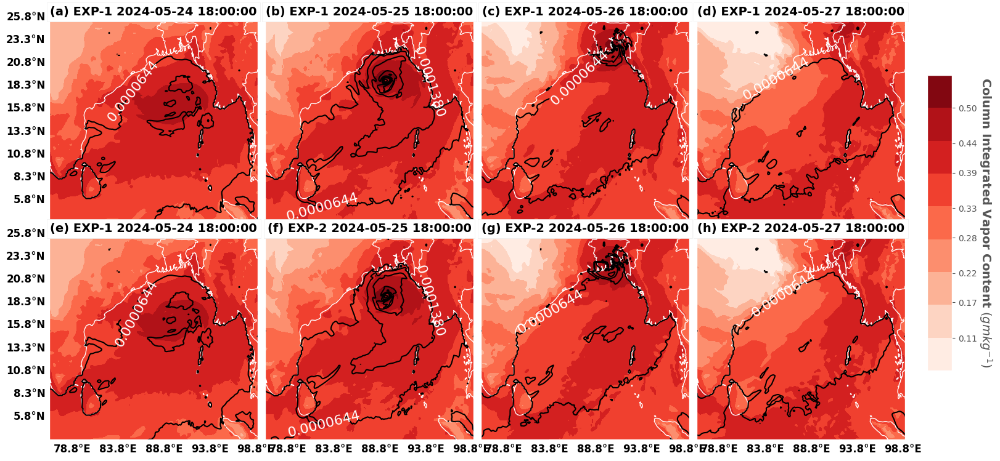

In [91]:
extent = [int(np.nanmin(lon))+0.3,int(np.nanmax(lon)),\
          int(np.nanmin(lat))+0.3,int(np.nanmax(lat))+2]

composite(qvar,qfx, lon, lat, extent,colormap = 'Reds',ccolor = "white",\
          ccolor2 = "k",vmin =None)


# **Analysis 3(i)**

In [92]:
path = [pd1,pd2]

netRadiation,totalRain = [],[]
for j in range(2):
    netRadiation_,totalRain_ = [],[]
    for i in np.arange(3,17,4):

        dt = xr.open_dataset(path[j][i])
        netRadiation_.append(dt.SWDOWN.values[0,:,:] - dt.OLR.values[0,:,:])

        totalRain_.append(dt.RAINC.values[0,:,:]+dt.RAINNC.values[0,:,:])


    netRadiation.append(np.array(netRadiation_))
    totalRain.append(np.array(totalRain_))

netRadiation = np.array(netRadiation)
totalRain = np.array(totalRain)

lon, lat = dt.XLONG.values[0,:,:],dt.XLAT.values[0,:,:]
    
extent = [int(np.nanmin(lon))+0.3,int(np.nanmax(lon)),\
          int(np.nanmin(lat))+0.3,int(np.nanmax(lat))+2]





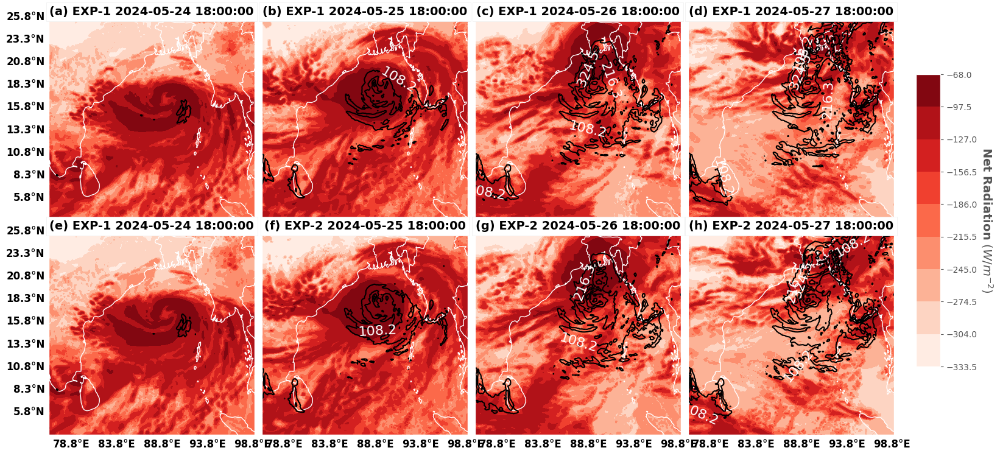

In [93]:
composite(netRadiation,totalRain,lon,lat,extent,\
          adjust = 0.62,\
          title="Analysis-3-i_Net Radiation", unit = "$(W/m^{-2})$",\
          colormap = 'Reds',ccolor = "white",\
          ccolor2 = "k",vmin =None)


# **Analysis 3(ii)**

In [15]:

#tr_half = pd.read_csv("/kaggle/input/tc-csv/tc_half.csv")
#tr_1 = pd.read_csv("/kaggle/input/tc-csv/tc_1.csv")
path = [pd1,pd2]
trD = [tc_1,tc_2]

qcloud,qrain,qice,qnice,qgraup = [],[],[],[],[]
for j in range(2):
    qcloud_,qrain_,qice_,qnice_,qgraup_ = [],[],[],[],[]
    
    lonIndex,latIndex = trD[j].lonIndex.values,trD[j].latIndex.values
    
    for i in range(17):
        dt = xr.open_dataset(path[j][i])

        qcloud_.append(np.nansum(dt.QCLOUD.values[0,:,latIndex[i],\
                                      lonIndex[i]]))
        qrain_.append(np.nansum(dt.QRAIN.values[0,:,latIndex[i],\
                                      lonIndex[i]]))
        qice_.append(np.nansum(dt.QICE.values[0,:,latIndex[i],\
                                      lonIndex[i]]))
        qnice_.append(np.nansum(dt.QNICE.values[0,:,latIndex[i],\
                                      lonIndex[i]]))
        qgraup_.append(np.nansum(dt.QGRAUP.values[0,:,latIndex[i],\
                                      lonIndex[i]]))
    qcloud.append(np.array(qcloud_))
    qrain.append(np.array(qrain_))
    qice.append(np.array(qice_))
    qnice.append(np.array(qnice_))
    qgraup.append(np.array(qgraup_))
    

qcloud = np.array(qcloud)
qrain = np.array(qrain)
qice = np.array(qice)
qnice = np.array(qnice)
qgraup = np.array(qgraup)

lon, lat = dt.XLONG.values[0,:188,:188],dt.XLAT.values[0,:188,:188]

    
extent = [int(np.nanmin(lon))+0.3,int(np.nanmax(lon)),\
          int(np.nanmin(lat))+0.3,int(np.nanmax(lat))]


print("Completed")


Completed


In [16]:
qcloud.shape

(2, 17)

In [18]:
for i in range(2):
    trD[i]["qcloud"] = qcloud[i]
    trD[i]["qrain"] = qrain[i]
    trD[i]["qice"] = qice[i]
    trD[i]["qnice"] = qnice[i]
    trD[i]["qgraup"] = qgraup[i]

    if i==0:
        sf = "including_sundarban"
    else:
        sf = "excluding_sundarban"
    trD[i].to_csv("/kaggle/working/tc_microphysics_{}.csv".format(sf), index = False)
    

In [19]:
"""trD = [pd.read_csv("/kaggle/input/tc-including-microphysics/tc_microphysics_half.csv"),\
      pd.read_csv("/kaggle/input/tc-including-microphysics/tc_microphysics_1.csv")]"""

vars_ = []
for i in trD:
    vars_.append([i.qcloud.values,i.qrain.values,i.qice.values,\
                  i.qnice.values,i.qgraup.values])


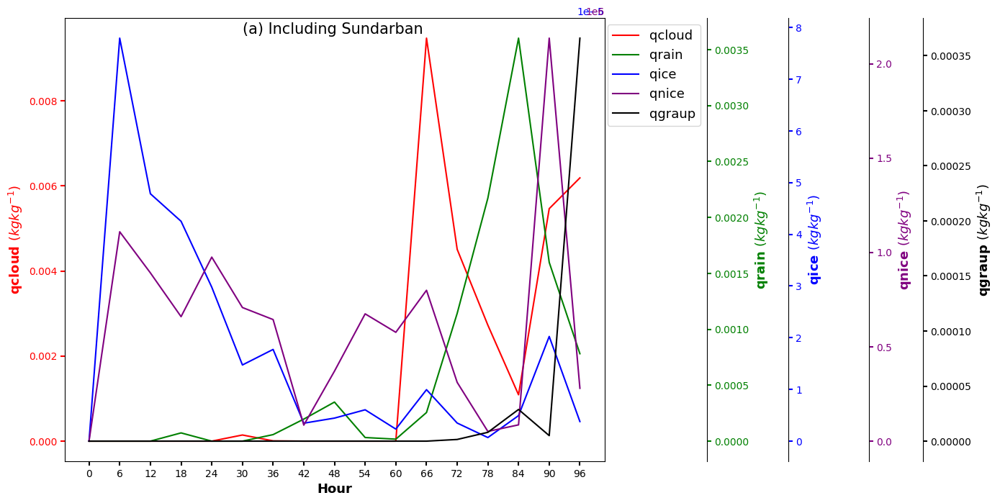

In [49]:
# MSV = maxuimum sustained velocity


import matplotlib.pyplot as plt

def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)


def multiScaleLine(data, sim_no,sequence, cc, fnt = 13, anchor = 1.19):


    labels = ["qcloud","qrain", "qice",\
                  "qnice","qgraup"]

    plt.style.use('default')

    fig, ax1 = plt.subplots(figsize = (12,8))
    fig.subplots_adjust(right=0.75)

    ax2 = ax1.twinx()
    ax3 = ax1.twinx()
    ax4 = ax1.twinx()
    ax5 = ax1.twinx()

    unit = " $(kg kg^{-1})$"

    ax1.set_xlabel('Hour', fontweight = "bold", fontsize = fnt)
    ax1.set_ylabel(labels[0]+unit, fontweight = "bold", c = 'red', fontsize = fnt)
    p1,  = ax1.plot(data[0], color = 'red', label = labels[0])

    ax2.set_ylabel(labels[1]+unit, fontweight = "bold", c = 'green', fontsize = fnt)
    p2, = ax2.plot(data[1],color = 'green', label = labels[1])

    ax3.set_ylabel(labels[2]+unit, fontweight = "bold", c = 'blue', fontsize = fnt)
    p3, = ax3.plot(data[2],color = 'blue', label = labels[2])

    ax4.set_ylabel(labels[3]+unit, fontweight = "bold", c = 'purple', fontsize = fnt)
    p4, = ax4.plot(data[3],color = 'purple', label = labels[3])

    ax5.set_ylabel(labels[4]+unit, fontweight = "bold", c = 'k', fontsize = fnt)
    p5, = ax5.plot(data[4],color = 'k', label = labels[4])

    ax2.spines["right"].set_position(("axes", anchor))

    make_patch_spines_invisible(ax2)

    ax2.spines["right"].set_visible(True)

    ax3.spines["right"].set_position(("axes", anchor+0.15))

    make_patch_spines_invisible(ax3)

    ax3.spines["right"].set_visible(True)

    ax4.spines["right"].set_position(("axes", anchor+0.30))

    make_patch_spines_invisible(ax4)

    ax4.spines["right"].set_visible(True)

    ax5.spines["right"].set_position(("axes", anchor+0.40))

    make_patch_spines_invisible(ax5)

    ax5.spines["right"].set_visible(True)

    tkw = dict(size=4, width=1.5)
    ax1.tick_params(axis='y', colors=p1.get_color(), **tkw)
    ax2.tick_params(axis='y', colors=p2.get_color(), **tkw)
    ax3.tick_params(axis='y', colors=p3.get_color(), **tkw)
    ax4.tick_params(axis='y', colors=p4.get_color(), **tkw)
    ax5.tick_params(axis='y', colors=p5.get_color(), **tkw)
    ax1.tick_params(axis='x', **tkw)

    lines = [p1, p2, p3, p4, p5]

    ax1.legend(lines, [l.get_label() for l in lines], loc = "upper right",
           bbox_to_anchor = (anchor,1), 
           facecolor = 'w', fontsize = fnt)
    plt.xticks(np.arange(0,17,1),np.arange(0,97,6))
    plt.xlabel("Time", fontweight = "bold", fontsize = fnt)
    #plt.tight_layout()

    plt.text(cc[0],cc[1],sequence, fontsize = 15)
    plt.savefig("/kaggle/working/analysis_3_ii{}.jpg".format(sim_no))
    plt.show()

multiScaleLine(vars_[0],"_simulation_1",sequence = "(a) Including Sundarban",\
               cc = [5,0.00037])


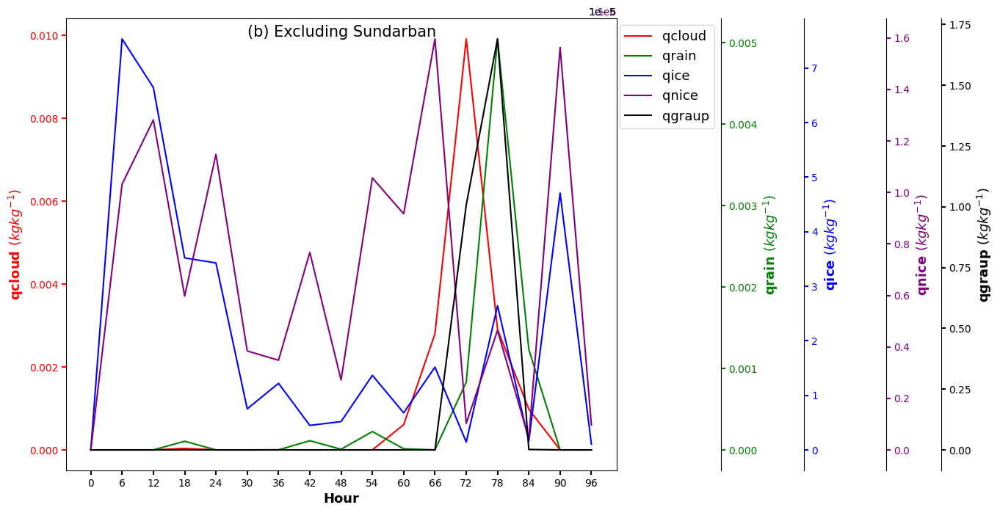

In [52]:
multiScaleLine(vars_[1],"_simulation_2", sequence = "(b) Excluding Sundarban",\
               cc = [5,0.000017])

# **Analysis 5: Validation**

In [57]:
from scipy.interpolate import RegularGridInterpolator, interp2d,LinearNDInterpolator

# define interpolation
def interp(x,y,data):
    interp_ = interp2d(x = x, y = y,z= data, kind='linear')
    return interp_



#X,Y = np.arange(80,97.25,0.25),np.arange(11,25.25,0.25)
dt = xr.open_dataset(pd1[-11])
lon = dt.XLONG.values[0,:188,:188]
lat = dt.XLAT.values[0,:188,:188]


#x = np.linspace(np.min(lon), np.max(lon),75)
#y = np.linspace(np.min(lat), np.max(lat),75)


#x,y = np.meshgrid(x,y, indexing="ij")

x,y = lon[0,:].copy(),lat[:,0].copy()

u10_half = dt.U10.values[0,:188,:188]
v10_half = dt.V10.values[0,:188,:188]
lai = dt.LAI.values[0,0:188,:188]

dt = xr.open_dataset(pd2[-11])

u10_one = dt.U10.values[0,:188,:188]
v10_one = dt.V10.values[0,:188,:188]


In [58]:
# Remote sensing wind CoastWatch

windRS = xr.open_dataset("/kaggle/input/remote-sensing-validation/CCMP_RT_Wind_Analysis_20240526_V02.1_L3.0_RSS.nc")

uRS = windRS.uwnd.values[3,361:429,312:388]
vRS = windRS.vwnd.values[3,361:429,312:388]

lonRS = windRS.longitude.values[312:388]
latRS = windRS.latitude.values[361:429]

velRS = (uRS**2+vRS**2)**0.5

extent = [np.nanmin(lonRS), np.nanmax(lonRS),np.nanmin(latRS),np.nanmax(latRS)]

extent


[78.125, 96.875, 11.875, 28.625]

In [59]:
#Interpolate wind and LAI

# define grid

X,Y = lonRS.copy(),latRS.copy()

# Interpolation GFS 0.5
u10i = interp(x,y,u10_half)
u10i_half = u10i(X,Y)

v10i = interp(x,y,v10_half)
v10i_half = v10i(X,Y)

laii_ = interp(x,y,lai)
laii = laii_(X,Y)

vel10i_half = (u10i_half**2+v10i_half**2)**0.5

# Interpolation GFS 1
u10i = interp(x,y,u10_one)
u10i_one = u10i(X,Y)

v10i = interp(x,y,v10_one)
v10i_one = v10i(X,Y)

vel10i_one = (u10i_one**2+v10i_one**2)**0.5


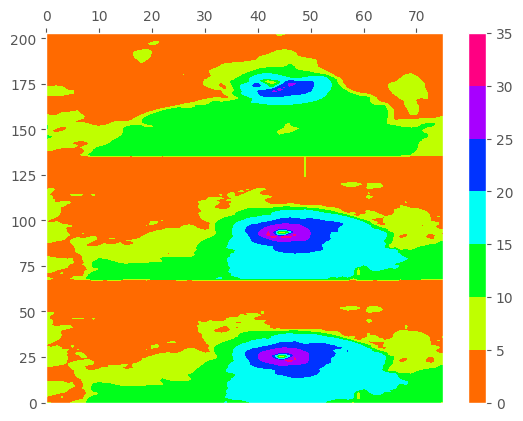

In [60]:
m = plt.contourf(np.vstack([vel10i_half,vel10i_one,velRS]), cmap = "hsv")
plt.colorbar()
plt.show()

In [61]:
# Calculate RMSE for velocity

vel10i_half, vel10i_one, velRS

rmse_half = (np.nansum((vel10i_half-velRS)**2)/(velRS.shape[0]*velRS.shape[1]))**0.5

rmse_half = ((rmse_half*3600)/1000)*0.54

rmse_one = (np.nansum((vel10i_one-velRS)**2)/(velRS.shape[0]*velRS.shape[1]))**0.5

rmse_one = ((rmse_one*3600)/1000)*0.54


In [62]:
# Correlation between velocity and LAI

from scipy.stats import spearmanr as corr

corr_half_lai = corr(vel10i_half.flatten(),laii.flatten())

rho_half, pvalue_half = corr_half_lai

corr_one_lai = corr(vel10i_one.flatten(),laii.flatten())

rho_one, pvalue_half = corr_one_lai

corr_rs_lai = corr(velRS.flatten(),laii.flatten())

rho_rs, pvalue_rs = corr_rs_lai

rho_half, rho_one, rho_rs


(-0.7610917755528712, -0.7546609650444028, -0.7468001882886364)

In [63]:
data1vel = np.array([vel10i_half,vel10i_one,velRS])
data1lai = np.array([ laii, laii, laii])
data2 = np.array([[u10i_half,v10i_half],[u10i_one,v10i_one],[uRS,vRS]])

data1vel.shape, data2.shape

((3, 68, 76), (3, 2, 68, 76))

In [64]:
# Plot

# Data: u10i_half, v10i_half, vel10i_half, laii, uRS, vRS, velRS

output = "/kaggle/working/"

from matplotlib import gridspec

plt.style.use('ggplot')
plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True

seq = ["(a) EXP-1","(b) EXP-2","(c) RS"]

from datetime import datetime as date

dates = [str(date(2024,5,d,18)) for d in [24,25,26]]


def composite(data1,data2,seq = seq,lon=X,lat=Y,extent = extent,adjust = 0.62,\
              title="Analysis2HeatFlux_Column Integrated Vapor Content",\
              unit= "$(m s^{-1})$", colormap=cmp,scale1=10,scale2=7):


  vmin1,vmax1 = np.nanmin(data1),np.nanmax(data1)

  vmin2,vmax2 = np.nanmin(data2),np.nanmax(data2)

  nrow = 1
  ncol = 3

  #eName
  fig = plt.figure(figsize=((ncol+1)*4, (nrow+1)*4))



  gs = gridspec.GridSpec(nrow, ncol,wspace=0,
                         hspace=0, top=1.-adjust/(nrow+1), 
                         bottom=adjust/(nrow+1), left=0.15, right=0.85)
  #gs = gridspec.GridSpec(nrow, ncol,wspace=0.0, hspace=0.0, top=1.-0.5/(nrow+1), bottom=0.5/(nrow+1), left=0.5/(ncol+1), right=1-0.5/(ncol+1))


  j = -1
  for i in range(nrow):
    for k in range(ncol):
      j+=1
      ax = plt.subplot(gs[i,k], projection=ccrs.PlateCarree())
      lon1,lon2,lat1,lat2=extent
      ax.set_extent([lon1,lon2,lat1,lat2], ccrs.PlateCarree())
      ax.add_feature(cfeature.COASTLINE, color = 'k', linewidth = 1)
      ax.add_feature(cfeature.BORDERS, color = 'k', linewidth = 0.5)   
      gl = ax.gridlines()
      gl.top_labels = False
      gl.xlines = False
      gl.ylines = False
      gl.bottom_labels = True
      if j in [1,2]:
        
        gl.left_labels = False
        gl.right_labels =False        
      elif j ==0:
        
        gl.left_labels = True
      
          
        

          
      gl.xlocator = mticker.FixedLocator(np.arange(lon1,lon2,3.5))
      gl.ylocator = mticker.FixedLocator(np.arange(lat1,lat2,3.5))
        
      gl.xlabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}
      gl.ylabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}
    

      m = ax.contourf(lon, lat,data1[k,:,:],cmap = colormap, 
                            transform = ccrs.PlateCarree(),extent = extent,
                            vmin = vmin1, vmax = vmax1,
                            levels = np.linspace(vmin1, vmax1, scale1))

      if title.split("_")[1] == "LAI":
          ax.quiver(lon,lat, data2[k,0, :,:],data2[k,1, :,:], color='black')
      elif data2 is not None:
          plt.streamplot(lon,lat,data2[k,0, :,:],data2[k,1, :,:],
                     color = "k",
                             transform = ccrs.PlateCarree())
      else:
          pass
     
        
  
      ax.text(sum(extent[:2])/2,extent[3]-1,"{}".format(seq[j]), 
                bbox = {"facecolor":"white"}, fontweight = 'bold', 
                horizontalalignment='center',fontsize = 14)
      
        
      
  cbar_ax = fig.add_axes([0.865, 0.325, 0.015, 0.35]) # [left,bottom,width,height]
  #cbar_ax = fig.add_axes([0.865, 0.37, 0.015, 0.25]) # [left,bottom,width,height]
  
 
  cb = fig.colorbar(m,  cax=cbar_ax,
                   ticks = [round(i,2) for i in np.linspace(vmin1,vmax1,scale1)])
  cbl = title.split("_")[1]+" "+unit
  cb.set_label(cbl, rotation = 270, fontweight = 'bold',
               fontsize = 14, labelpad = 20)

    
  
  plt.savefig(output+title+".jpg")
  plt.show()




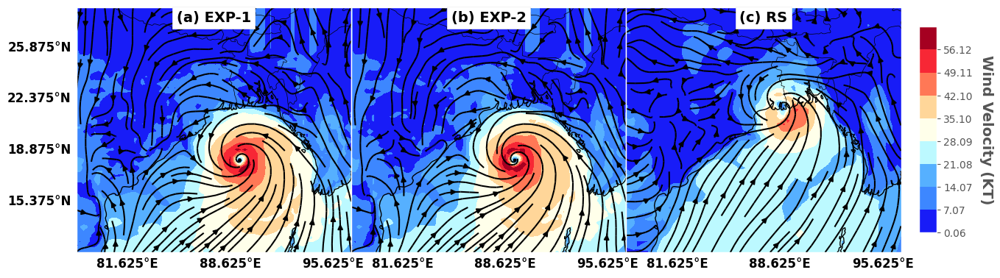

In [65]:
# Validation plot of wind

composite(((data1vel*3600)/1000)*0.54,data2,adjust = 0.5,\
              title="validation_Wind Velocity",\
              unit= "(KT)", colormap=cmp)

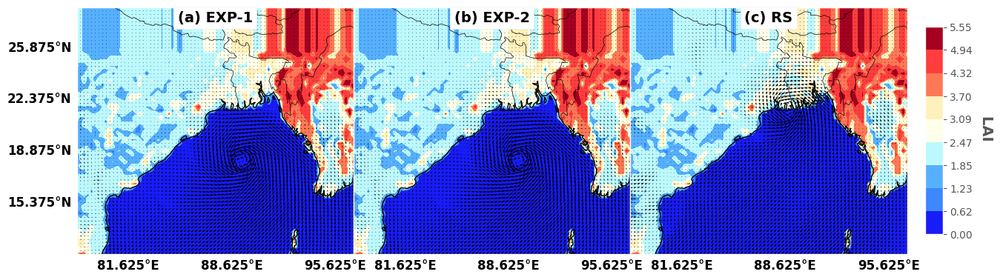

In [66]:
# validation plot of LAI composited with LAI

composite(data1lai,data2,adjust = 0.5,\
              title="validation_LAI",\
              unit= "", colormap=cmp)

In [51]:
extent

[78.125, 96.875, 11.875, 28.625]

In [96]:
# Prepare Remote Sensing Rain Data

rainRS = pd.read_csv("/kaggle/input/remote-sensing-validation/rainfall_May_26.CSV")

cols = rainRS.columns[list(rainRS.columns).index("11.875"): list(rainRS.columns).index("28.625")]

rows = 0,list(rainRS["lat/lon"].values).index(78.125)  #0 == 89.875

rainfallRS = np.array([np.array(rainRS[i].values[rows[0]:rows[1]][::-1]) for i in cols])

rainfallRS[rainfallRS==99999] = np.nan

lonRS = [float(i) for i in cols]
latRS = rainRS["lat/lon"].values[0:rows[1]][::-1]

extent = [np.nanmin(lonRS), np.nanmax(lonRS),np.nanmin(latRS),np.nanmax(latRS)]

extent



[11.875, 28.375, 78.375, 89.875]

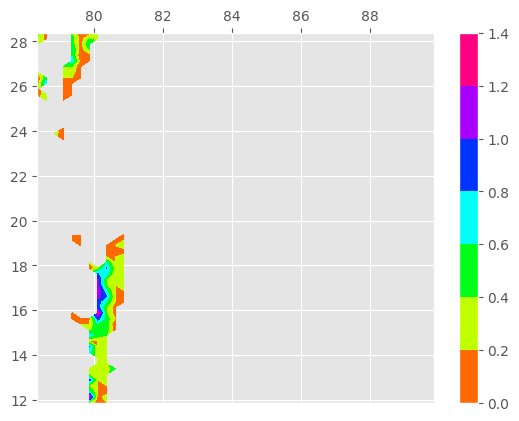

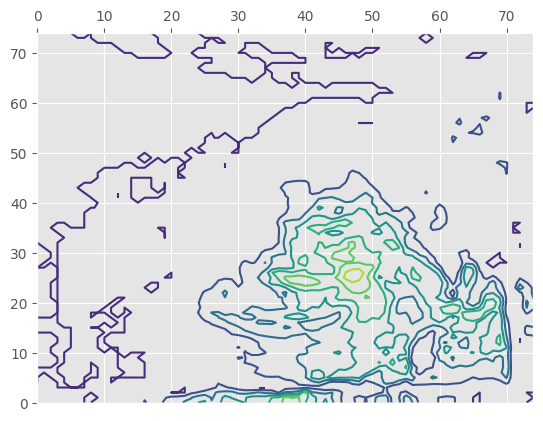

In [98]:
m  = plt.contourf(latRS, lonRS, rainfallRS, cmap = "hsv")

plt.colorbar(m)
plt.show()
plt.contour(rainfall_half)

In [79]:
from scipy.interpolate import interp2d

# define interpolation
def interp(x,y,data):
    interp_ = interp2d(x = x, y = y,z= data, kind='linear')
    return interp_



dt = xr.open_dataset(pd01[-1])
lon = dt.XLONG.values[0,:75,:75]
lat = dt.XLAT.values[0,:75,:75]


x,y = lon[0,:].copy(),lat[:,0].copy()

rainfall_half = dt.RAINC.values[0,:75,:75]


dt = xr.open_dataset(pd11[-1])

rainfall_one = dt.RAINC.values[0,:75,:75]



In [101]:
#Interpolate rain

# define grid

X,Y = lonRS.copy(),latRS.copy()

# Interpolation GFS 0.5
raini = interp(x,y,rainfall_half)
raini_half = raini(X,Y)


# Interpolation GFS 1
raini = interp(x,y,rainfall_one)
raini_one = raini(X,Y)


In [114]:
# Reverse rainfall data

rainfall_i_half = np.zeros(rainfallRS.shape[:])
rainfall_i_one = rainfall_i_half.copy()

for i in range(raini_half.shape[0]):
    for j in range(raini_half.shape[1]):
        rainfall_i_half[j,i] = raini_half[i,j]
        rainfall_i_one[j,i] = raini_one[i,j]

rainfall_i_half.shape==rainfall_i_one.shape==rainfallRS.shape
    

True

In [116]:
# Prepare rainfall to plot

data1 = np.array([rainfall_i_half,rainfall_i_one, rainfallRS])

data1.shape

(3, 67, 47)

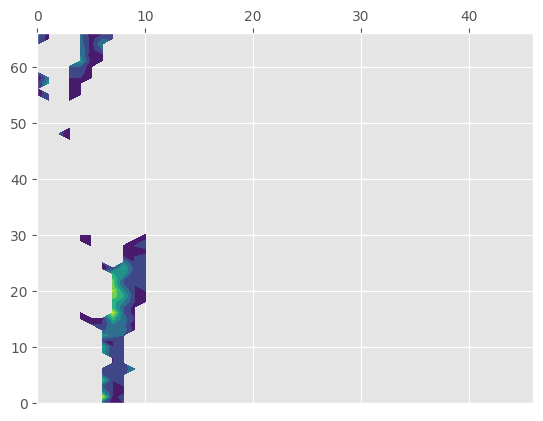

In [124]:
plt.contourf(rainfallRS)

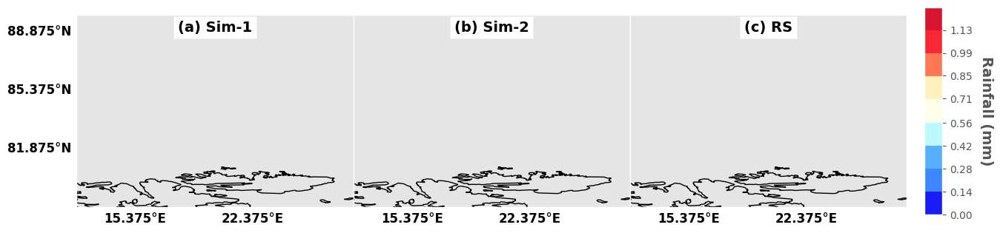

In [121]:
# Validation plot rain

# Validation plot of wind

composite(data1,data2=None,lon = Y,lat = X,adjust = 0.5,\
              title="validation_Rainfall",\
              unit= "(mm)", colormap=cmp)

In [16]:
def arr(n):
    emp_ = []
    for k in range(3):
        m = n[k][:69,:57][::-1,:]

        emp = np.zeros([57,69])

        for i in range(57):
            for j in range(69):
                emp[i,j] = m[j,i]
        emp_.append(emp)
    return np.array(emp_)

u10v,v10v,vel10v,t2v = [arr(n) for n in [u10v,v10v,vel10v,t2v]]

[i.shape for i in [u10v,v10v,vel10v,t2v]]

[(3, 57, 69), (3, 57, 69), (3, 57, 69), (3, 57, 69)]

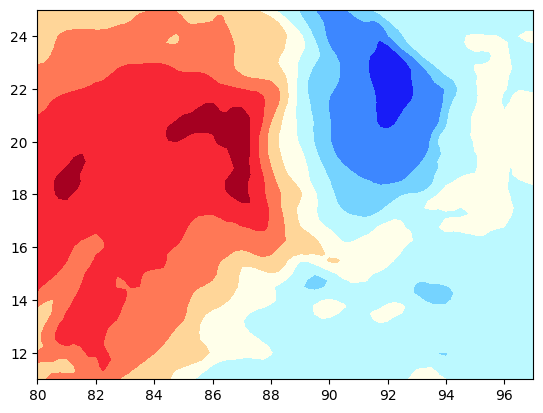

In [13]:
plt.contourf(X,Y, emp, cmap = cmp)

In [15]:
xr.open_dataset(pathVS[0]).latitude.values

array([25.  , 24.75, 24.5 , 24.25, 24.  , 23.75, 23.5 , 23.25, 23.  ,
       22.75, 22.5 , 22.25, 22.  , 21.75, 21.5 , 21.25, 21.  , 20.75,
       20.5 , 20.25, 20.  , 19.75, 19.5 , 19.25, 19.  , 18.75, 18.5 ,
       18.25, 18.  , 17.75, 17.5 , 17.25, 17.  , 16.75, 16.5 , 16.25,
       16.  , 15.75, 15.5 , 15.25, 15.  , 14.75, 14.5 , 14.25, 14.  ,
       13.75, 13.5 , 13.25, 13.  , 12.75, 12.5 , 12.25, 12.  , 11.75,
       11.5 , 11.25, 11.  , 10.75, 10.5 , 10.25, 10.  ,  9.75,  9.5 ,
        9.25,  9.  ,  8.75,  8.5 ,  8.25,  8.  ,  7.75,  7.5 ,  7.25,
        7.  ,  6.75,  6.5 ,  6.25,  6.  ,  5.75,  5.5 ,  5.25,  5.  ])

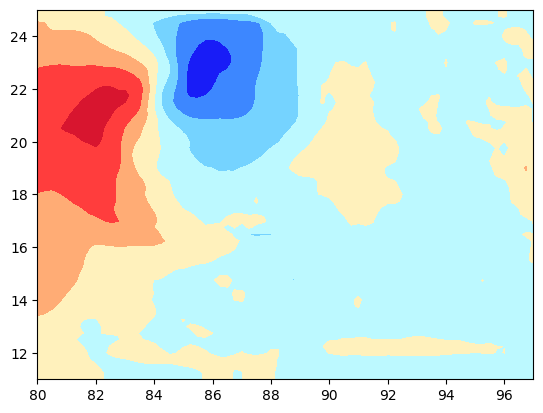

In [17]:
# define grid
dt = xr.open_dataset(pd01[-1])
lon = dt.XLONG.values[0,:75,:75]
lat = dt.XLAT.values[0,:75,:75]


x = np.linspace(np.min(lon), np.max(lon),75)
y = np.linspace(np.min(lat), np.max(lat),75)


x,y = np.meshgrid(x,y, indexing="ij")

des = xr.open_dataset(pd01[18])
u10_ = des.U10.values[0,:,:]
u10i = interp(x,y,u10_)
u10 = u10i(X,Y)

plt.contourf(X,Y,u10, cmap = cmp)

In [18]:
# Read simulation 1
pathS1 = [pd01[18],pd01[18+24],pd01[18+24+24]]
u10v10_1 = []

for i in pathS1:
    des = xr.open_dataset(i)
    u10_ = des.U10.values[0,:,:]
    u10i = interp(x,y,u10_)
    u10 = u10i(X,Y)
    v10_ = des.V10.values[0,:,:]
    v10i = interp(x,y,v10_)
    v10 = v10i(X,Y)
    vel10 = (u10**2+v10**2)**0.5
    t2_ = des.T2.values[0,:,:]
    t2i = interp(x,y,t2_)
    t2 = t2i(X,Y)
    u10v10_1.append([u10,v10,vel10,t2])

u10_1 = np.array([i[0] for i in u10v10_1])
v10_1 = np.array([i[1] for i in u10v10_1])
vel10_1 = np.array([i[2] for i in u10v10_1])
t2_1 = np.array([i[3] for i in u10v10_1])

t2_1.shape

(3, 57, 69)

In [68]:
# Read simulation 2
pathS2 = [pd11[18],pd11[18+24],pd11[18+24+24]]
u10v10_2 = []

for i in pathS2:
    des = xr.open_dataset(i)
    u10_ = des.U10.values[0,:,:]
    u10i = interp(x,y,u10_)
    u10 = u10i(X,Y)
    v10_ = des.V10.values[0,:,:]
    v10i = interp(x,y,v10_)
    v10 = v10i(X,Y)
    vel10 = (u10**2+v10**2)**0.5
    t2_ = des.T2.values[0,:,:]
    t2i = interp(x,y,t2_)
    t2 = t2i(X,Y)
    u10v10_2.append([u10,v10,vel10,t2])

u10_2 = np.array([i[0] for i in u10v10_2])
v10_2 = np.array([i[1] for i in u10v10_2])
vel10_2 = np.array([i[2] for i in u10v10_2])
t2_2 = np.array([i[3] for i in u10v10_2])

t2_2.shape

(3, 57, 69)

In [70]:
from sklearn.metrics import cohen_kappa_score



def score(m1,m2):
    rmse_,kappa_ = [],[]
    for i in range(3):
        rmse_.append((sum((m1[i].flatten()-m2[i].flatten())**2)/(57*69))**0.5)

        v1 = m1[i].copy()
        v2 = m2[i].copy()

        v1m = np.nanmean(v1)
        v2m = np.nanmean(v2)
        v1[v1>v1m]=999
        v1[v1<=v1m]=0
        v1[v1==999]=1
        v2[v2>v2m]=999
        v2[v2<=v2m]=0
        v1[v1==999]=1
        kappa_.append(cohen_kappa_score(v1.flatten(),v2.flatten()))

    return np.array(rmse_),np.round(np.array(kappa_)*100,2)

m1,m2 = [vel10v,t2v],[vel10_1,t2_1]
score1 = [score(m1[j],m2[j]) for j in range(2)]

m2 = [vel10_2,t2_2]
score2 = [score(m1[j],m2[j]) for j in range(2)]

print(score1,"\n\n", score2)

[(array([  4.34716538, 100.35820451,   5.10361655]), array([20.45,  9.48, 16.82])), (array([44.37908596, 32.6222041 , 17.34242245]), array([-1.7 , -0.22,  1.08]))] 

 [(array([4.26401563, 5.75789893, 5.11085411]), array([20.5 , 21.06, 17.  ])), (array([43.33574479, 43.51274236, 26.69362004]), array([-2.52, -2.13,  0.93]))]


# **Analysis 4 and 7**

In [144]:


output = "/kaggle/working/"

from matplotlib import gridspec

def barbPlot(lon, lat, u,v,data,extent=[78,98,11,30],scale=10):
    
    
    plt.style.use('ggplot')
    plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
    plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True
    

    fig, ax = plt.subplots(figsize=(20, 20), 
                       subplot_kw={'projection': ccrs.PlateCarree()})

    lon0 = extent[0]
    lon1 = extent[1]
    lat0 = extent[2]
    lat1 = extent[3]
    ax.set_extent( [lon0,lon1,lat0,lat1],crs = ccrs.PlateCarree())
    #ax.add_image(request, 8, interpolation='bicubic')

    #ax.add_feature(cfeature.LAND, color = 'lightgray', alpha=0.2)
    ax.add_feature(cfeature.COASTLINE, color = 'k', linewidth = 2)
    ax.add_feature(cfeature.BORDERS, color = 'k', linewidth = 2)
    #ax.add_feature(cfeature.RIVERS, color = "k",linewidth = 2)
    #ax.add_feature(cfeature.OCEAN, color = "darkblue",alpha=0.2)
      
    gl = ax.gridlines()
    gl.top_labels = False
    gl.xlines = False
    gl.ylines = False
    gl.bottom_labels = True
    gl.left_labels = True
        

    gl.xlocator = mticker.FixedLocator([np.round(i,1)
                                        for i in np.linspace(lon0,lon1,8)])
    gl.ylocator = mticker.FixedLocator([np.round(i,1)
                                        for i in np.linspace(lat0,lat1,8)])
        
    gl.xlabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}
    gl.ylabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}

    
    vmin_,vmax_ = np.nanmin(data),np.nanmax(data)
    m = ax.contourf(lon,lat, data, 
                    vmin = vmin_,vmax =  vmax_,
                    levels = np.linspace(vmin_, vmax_, scale),
                    cmap = cmp)
    

    plt.colorbar(m, shrink = 0.7, label = "Total Precipitation (mm)",
                 orientation = "horizontal")

    ax.barbs(lon,lat, u, v, color='black',length = 5)
    #sizes=dict(emptybarb=0.1, spacing=0.2, height=0.3))
    

   
    plt.savefig("/kaggle/working/wind_precipitation_landfall.jpg",\
                bbox_inches='tight')

    plt.show()


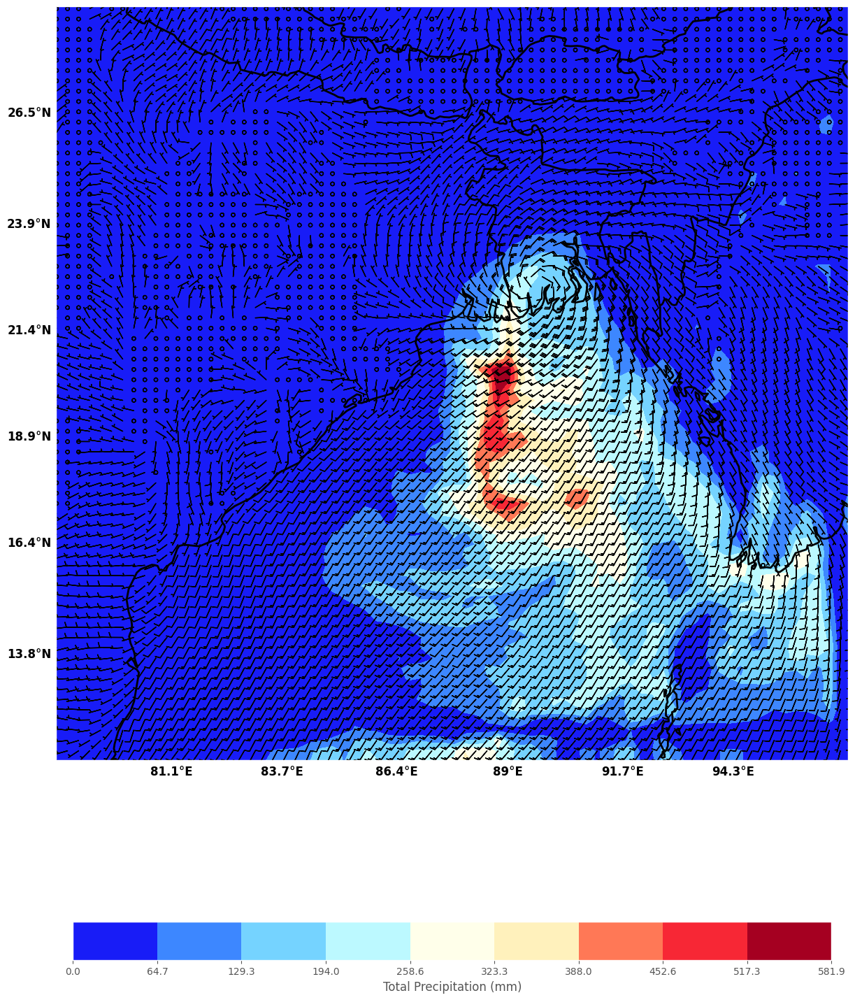

In [145]:
# Unnecessary

dt = xr.open_dataset(pd01[-1])
lon = dt.XLONG.values[0,:75,:75]
lat = dt.XLAT.values[0,:75,:75]


x_ = np.linspace(np.min(lon), np.max(lon),75)
y_ = np.linspace(np.min(lat), np.max(lat),75)
x,y = np.meshgrid(x_,y_)


extent = [int(np.nanmin(lon))+0.4,int(np.nanmax(lon)),\
          int(np.nanmin(lat))+0.3,int(np.nanmax(lat))]

u = dt.U10.values[0,:75,:75]
v = dt.V10.values[0,:75,:75]

data = dt.RAINC.values[0,:75,:75]+dt.RAINNC.values[0,:75,:75]

barbPlot(x,y, u,v,data,extent)

# **Analysis 6 and 8**

In [59]:
tr_half = pd.read_csv("/kaggle/input/track-dataset-updated/tc_half.csv")
tr_1 = pd.read_csv("/kaggle/input/track-dataset-updated/tc_1.csv")

path = [pd01,pd11]

dt = xr.open_dataset(pd01[0])

lon, lat = dt.XLONG.values[0,:,:], dt.XLAT.values[0,:,:]


def centerIndex(pres):

    
    min1in = [list(i).index(np.nanmin(i)) for i in pres]

    min1 = [np.nanmin(i) for i in pres]

    min2in = min1.index(min(min1))

    return min1in[min2in],min2in

def indexes(paths, csv, title = "half",l=0):

    lonIndex,latIndex = [],[]
    for path in paths:
        dt = xr.open_dataset(path)

        pres = dt.P.values[0,l,:,:]

        lonIndex_,latIndex_ = centerIndex(pres)
        lonIndex.append(lonIndex_)
        latIndex.append(latIndex_)

    if title=="half":

        csv["lonIndex"]=lonIndex
        csv["latIndex"]=latIndex
        csv.to_csv("/kaggle/working/tc_{}.csv".format(title),index=False)
    else:

        csv["lonIndex"]=lonIndex
        csv["latIndex"]=latIndex
        csv.to_csv("/kaggle/working/tc_{}.csv".format(title),index=False)

    return csv.lonIndex.values,csv.latIndex.values 


indexes(path[0],tr_half,"half")
indexes(path[1],tr_1,"1")

(array([41, 42, 44, 42, 43, 43, 44, 45, 45, 44, 44, 44, 44, 44, 44, 44, 43,
        43, 44, 44, 44, 44, 44, 44, 43, 43, 43, 43, 44, 43, 43, 42, 41, 42,
        42, 42, 41, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42,
        42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42]),
 array([13,  9, 14, 16, 16, 15, 16, 17, 18, 18, 19, 19, 20, 20, 20, 21, 21,
        21, 22, 22, 22, 23, 24, 25, 25, 25, 25, 25, 25, 26, 27, 27, 27, 27,
        28, 28, 28, 28, 29, 30, 30, 31, 32, 32, 33, 34, 34, 35, 35, 36, 36,
        37, 38, 38, 39, 39, 40, 41, 41, 42, 43, 43, 43, 44, 44, 45, 45]))

In [9]:
dt

<xarray.Dataset> Size: 147MB
Dimensions:                (Time: 1, south_north: 188, west_east: 188,
                            bottom_top: 44, bottom_top_stag: 45,
                            soil_layers_stag: 4, west_east_stag: 189,
                            south_north_stag: 189, seed_dim_stag: 8)
Coordinates:
    XLAT                   (Time, south_north, west_east) float32 141kB ...
    XLONG                  (Time, south_north, west_east) float32 141kB ...
    XTIME                  (Time) datetime64[ns] 8B ...
    XLAT_U                 (Time, south_north, west_east_stag) float32 142kB ...
    XLONG_U                (Time, south_north, west_east_stag) float32 142kB ...
    XLAT_V                 (Time, south_north_stag, west_east) float32 142kB ...
    XLONG_V                (Time, south_north_stag, west_east) float32 142kB ...
Dimensions without coordinates: Time, south_north, west_east, bottom_top,
                                bottom_top_stag, soil_layers_stag,
                                west_east_stag, south_north_stag, seed_dim_stag
Data variables: (12/172)
    Times                  (Time) |S19 19B ...
    LU_INDEX               (Time, south_north, west_east) float32 141kB ...
    ZNU                    (Time, bottom_top) float32 176B ...
    ZNW                    (Time, bottom_top_stag) float32 180B ...
    ZS                     (Time, soil_layers_stag) float32 16B ...
    DZS                    (Time, soil_layers_stag) float32 16B ...
    ...                     ...
    PCB                    (Time, south_north, west_east) float32 141kB ...
    PC                     (Time, south_north, west_east) float32 141kB ...
    LANDMASK               (Time, south_north, west_east) float32 141kB ...
    LAKEMASK               (Time, south_north, west_east) float32 141kB ...
    SST                    (Time, south_north, west_east) float32 141kB ...
    SST_INPUT              (Time, south_north, west_east) float32 141kB ...
Attributes: (12/134)
    TITLE:                            OUTPUT FROM WRF V4.4 MODEL
    START_DATE:                      2024-05-24_00:00:00
    SIMULATION_START_DATE:           2024-05-24_00:00:00
    WEST-EAST_GRID_DIMENSION:        189
    SOUTH-NORTH_GRID_DIMENSION:      189
    BOTTOM-TOP_GRID_DIMENSION:       45
    ...                              ...
    ISLAKE:                          21
    ISICE:                           15
    ISURBAN:                         13
    ISOILWATER:                      14
    HYBRID_OPT:                      2
    ETAC:                            0.2

In [10]:

tr_1 = pd.read_csv("/kaggle/input/including-microphysics-wrf-sundarban/tc_microphysics_including_sundarban.csv")
tr_2 = pd.read_csv("/kaggle/input/including-microphysics-wrf-sundarban/tc_microphysics_excluding_sundarban.csv")
path = [pd1,pd2]
trD = [tr_1,tr_2]

vel,p,draft,direction,u,v,h = [],[],[],[],[],[],[]
for j in range(2):
    vel_,p_,draft_,direction_,u_,v_,h_ = [],[],[],[],[],[],[]
    
    lonIndex = trD[j].lonIndex.values
    
    for i in np.arange(3,17,4):
        dt = xr.open_dataset(path[j][i])

        uy = dt.U.values[0,:,:188,lonIndex[i]]
        vy = dt.V.values[0,:,:188,lonIndex[i]]
        w = dt.W.values[0,:,:188,lonIndex[i]]
        h_.append(0.001*(dt.PH.values[0,:,:188,lonIndex[i]]\
                         +dt.PHB.values[0,:,:188,lonIndex[i]])/9.81)
        u_.append(uy)
        v_.append(vy)

        vel_.append((uy[:44,:188]**2+vy[:44,:188]**2)**0.5)
        draft_.append(w)
        direction_.append(np.arctan(uy/vy))

        p_.append(dt.P.values[0,:,:188,lonIndex[i]])


    vel.append(np.array(vel_))
    p.append(np.array(p_))
    draft.append(np.array(draft_))
    direction.append(np.array(direction_))
    u.append(np.array(u_))
    v.append(np.array(v_))
    h.append(np.array(h_))

vel = np.array(vel)
p = np.array(p)
draft = np.array(draft)
direction = np.array(direction)
u = np.array(u)
v= np.array(v)
h = np.array(h)
lon, lat = dt.XLONG.values[0,:188,:188],dt.XLAT.values[0,:188,:188]

    
extent = [int(np.nanmin(lon))+0.3,int(np.nanmax(lon)),\
          int(np.nanmin(lat))+0.3,int(np.nanmax(lat))]


print("Completed")


Completed


In [20]:


output = "/kaggle/working/"

from matplotlib import gridspec

seq_ = [i for i in "11112222"]
s = 0
seq = []
for i in "abcdefgh":
    seq.append("({})".format(i)+" EXP-"+seq_[s])

from datetime import datetime as date

dates = [str(date(2024,5,d,18)) for d in [24,25,26,27]]

def verticalContourf(lon,vcoord,u,v,data,h,title,extent,\
                     adjust=0.62,hspace = 0.1,wspace = 0.1,\
                     left = 0.15,scale=10):
    
    
    plt.style.use('ggplot')

    nrow,ncol = 2,4
    fig = plt.figure(figsize=((ncol+1)*4, (nrow+1)*4))
    gs = gridspec.GridSpec(nrow, ncol,wspace=wspace,
                         hspace=hspace, top=1.-adjust/(nrow+1), 
                         bottom=adjust/(nrow+1), left=left, right=1-left)
    
    plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = False
    plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True
    plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = False
    plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = True
    
    j = -1
    m4 = []
    for i in range(nrow):
        m3 = []
        for k in range(ncol):
            j+=1
            
            ax = plt.subplot(gs[i,k])
            lon1,lon2,v1,v2=extent
            
            ax.set_xticks(np.arange(lon1,lon2,3))
            ax.set_yticks(np.arange(v1,v2,5))

            ax.set_yticklabels([str(i) for i in np.arange(v1,v2,5)])
            ax.set_xticklabels([str(i)+" E" for i in np.arange(lon1,lon2,3)])
            
            vmin_,vmax_ = np.nanmin(data),np.nanmax(data)

            label = title+" (m$s^{-1}$)"
            
            m1 = ax.contourf(lon,vcoord, data[i,k,:,:], 
                    vmin = vmin_,vmax =  vmax_,
                    levels = np.linspace(vmin_, vmax_, scale),
                    cmap = cmp)

            m2 = ax.streamplot(lon,vcoord, u[i,k,:,:], v[i,k,:,:], color='black')
            m3 = ax.clabel(ax.contour(lon,vcoord,h[i,k,:,:],colors = "red"),colors = "red")

            ax.text(sum(extent[:2])/2,extent[3]+1,"{}".format(seq[j]+" "+dates[k]), 
                bbox = {"facecolor":"white"}, fontweight = 'bold', 
                horizontalalignment='center',fontsize = 14)

    cbar_ax = fig.add_axes([0.87, 0.2, 0.02, 0.6]) # [left,bottom,width,height]
    #cbar_ax = fig.add_axes([0.865, 0.37, 0.015, 0.25]) # [left,bottom,width,height]

    if vmax_<1:
        ticks = [int(i) for i in np.linspace(vmin_,vmax_,scale)]
    else:
        ticks = [np.round(i,2) for i in np.linspace(vmin_,vmax_,scale)]
 
    cb = fig.colorbar(m1,  cax=cbar_ax,
                   ticks = ticks)
    
    cb.set_label(label, rotation = 270, fontweight = 'bold',
               fontsize = 14, labelpad = 20)
       
    plt.savefig("/kaggle/working/{}.jpg".format(title),\
                bbox_inches='tight')

    plt.show()


<a list of 7 text.Text objects>

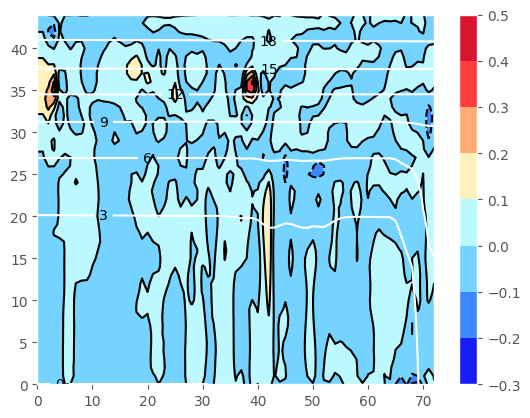

In [38]:
# unnecessary
w = dt.W.values[0,:,:73,27]

h = 0.001*(dt.PH.values[0,:,:73,27]+dt.PHB.values[0,:,:73,27])/9.81

m = plt.contourf(w,cmap = cmp)
plt.colorbar(m)
plt.contour(w,colors="k")
plt.clabel(plt.contour(h,colors = 'white'),colors = 'k')

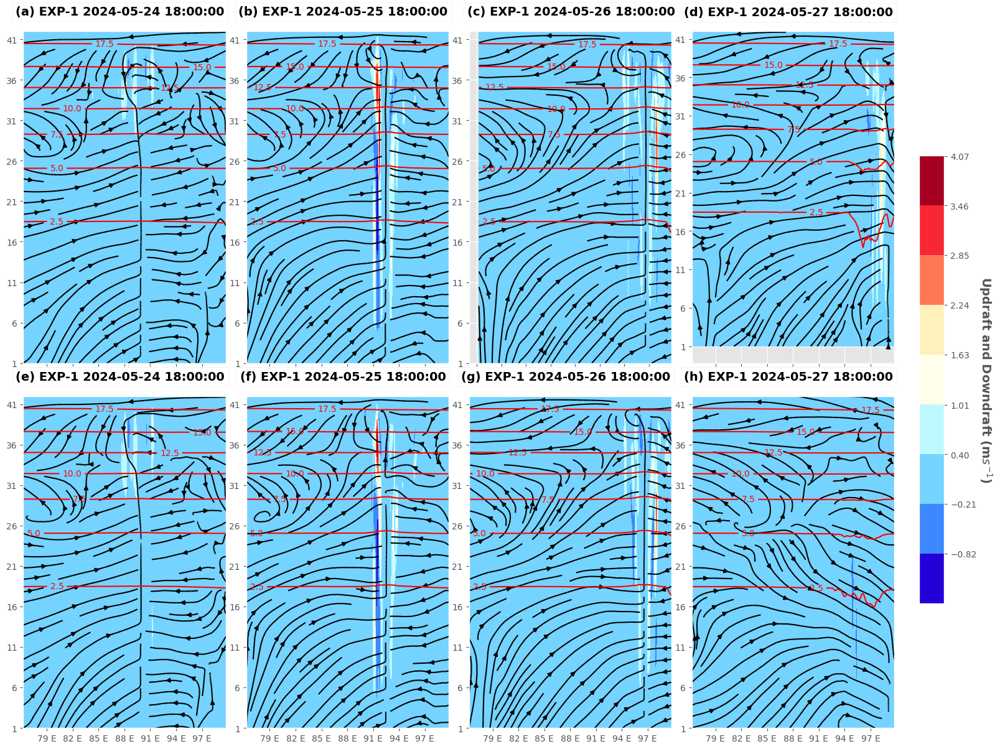

In [27]:
title = "Updraft and Downdraft"

dt = xr.open_dataset(pd1[-1])
lon = dt.XLONG.values[0,:188,:188]

x = np.linspace(np.min(lon), np.max(lon),188)
y = np.arange(1,43)
x,y = np.meshgrid(x,y)

extent = [int(np.nanmin(lon)),int(np.nanmax(lon)),\
          1,43]

#x,y = np.meshgrid(np.arange(75),np.arange(44))

data = draft[:,:,1:43,:188].copy()
verticalContourf(x,y, u[:,:,1:43,:188],v[:,:,1:43,:188],data,h[:,:,1:43,:188],title,extent,\
                 adjust=0.1, hspace = 0.1, wspace = 0.1)

In [102]:
# Replace this function with shearing deformation of metpy

def wind_shear(pres,vel,direction):

    velStress = np.array([vel[:,:,v,:] - vel[:,:,v-1,:] for v in range(1,44)])
    dirStress = np.array([direction[:,:,v,:] - direction[:,:,v-1,:] \
                          for v in range(1,44)])
    presS = pres[1:].copy()

    return velStress,dirStress, presS

velStress,dirStress, presS = wind_shear(p,vel,direction)
velStress.shape

(43, 2, 3, 75)

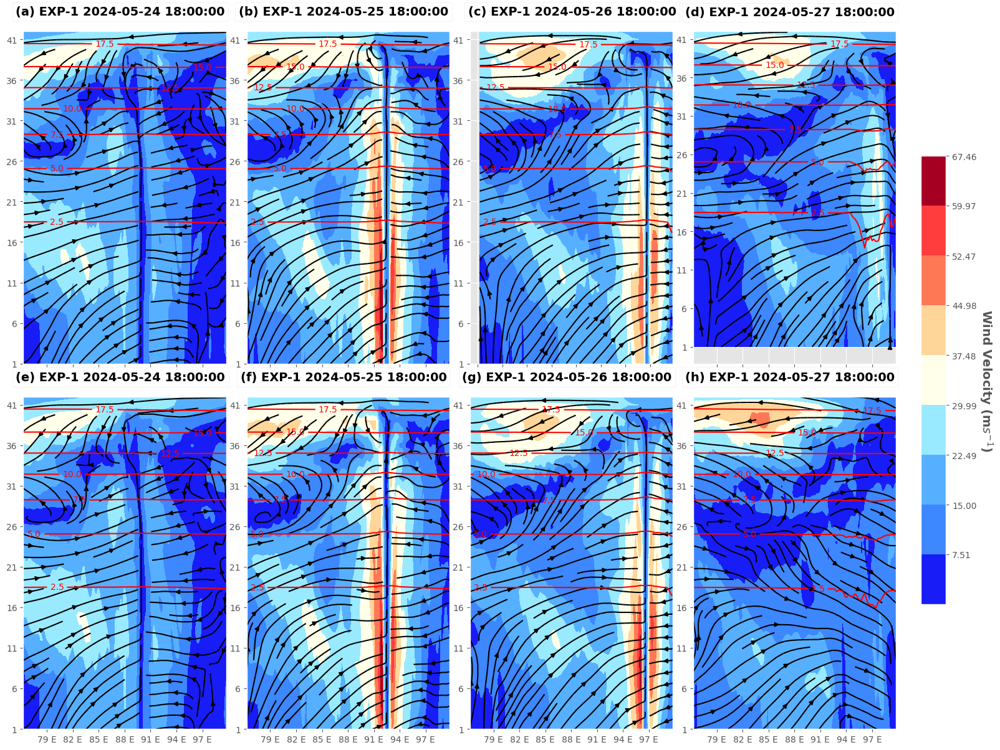

In [29]:
title = "Wind Velocity"

ii = 188

dt = xr.open_dataset(pd1[-1])
lon = dt.XLONG.values[0,:ii,:ii]

x = np.linspace(np.min(lon), np.max(lon),ii)
y = np.arange(1,43)
x,y = np.meshgrid(x,y)

extent = [int(np.nanmin(lon)),int(np.nanmax(lon)),\
          1,43]


data = vel[:,:,1:43,:ii]

verticalContourf(x,y,u[:,:,1:43,:ii],v[:,:,1:43,:ii],data,h[:,:,1:43,:ii],title,extent,\
                  adjust=0.1, hspace = 0.1, wspace = 0.1)

# **Analysis 9**

In [133]:
import gsw

# verify the function of GSW
gsw.geostrophy.distance([1,2,3],[1,2,3])/1000, (2*111.12**2)**0.5

(array([157.22543204, 157.17755181]), 157.14741105089834)

In [37]:
#lon1 (0.5), lat1, lon2 (1), lat2
# tc1_, tc2_
tcv_ = pd.read_csv("/kaggle/input/validation-track-remal/zoom_earth_TC_Remal_track2.csv")

lonV, latV = tcv_.lon.values, tcv_.lat.values
lon1, lat1 = tr_1.lon.values, tr_1.lat.values
lon2, lat2 = tr_2.lon.values, tr_2.lat.values

pd.DataFrame({"lon1":lon1[3:],"lon2":lon2[3:],"lonV":lonV[:-2],
      "lat1":lat1[3:],"lat2":lat2[3:],"latV":latV[:-2],
             }).to_csv("/kaggle/working/center_speed_raw_data.csv", index = False)


In [38]:
csrd = pd.read_csv("/kaggle/working/center_speed_raw_data.csv")


import gsw

s1 = (gsw.geostrophy.distance(csrd.lon1, csrd.lat1.values)/1000)*0.54
s2 = (gsw.geostrophy.distance(csrd.lon2, csrd.lat2.values)/1000)*0.54
s3 = (gsw.geostrophy.distance(csrd.lonV, csrd.latV.values)/1000)*0.54

pecs1,pecs2 = (abs(s3-s1)/s3)*100,(abs(s3-s2)/s3)*100  # Percent error in sim1 and sim2 respectively

pecs1.shape,len(pecs2)



((13,), 13)

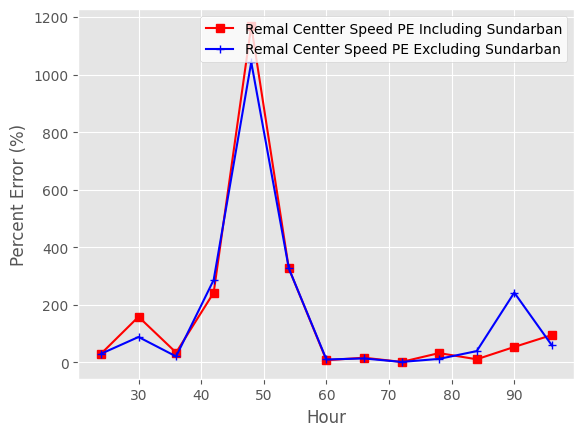

In [41]:
plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = True
plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = False

plt.style.use("ggplot")

plt.plot(np.arange(24,97,6),pecs1,\
         label = "Remal Centter Speed PE Including Sundarban",c = "red", marker = "s")
plt.plot(np.arange(24,97,6),pecs2,\
         label = "Remal Center Speed PE Excluding Sundarban",c = "blue", marker = "+")

plt.legend(loc = "best", facecolor = "white")

plt.xlabel("Hour")
plt.ylabel("Percent Error (%)")
plt.savefig("/kaggle/working/TC_center_speed.jpg")
plt.show()


In [ ]:
"""

output = "/kaggle/working/"

from matplotlib import gridspec

lon, lat, data = dt0.XLONG.values[0,:,:],dt0.XLAT.values[0,:,:],vel[0,:,:]



plt.style.use('ggplot')
plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True


   

fig, ax = plt.subplots(figsize=(16, 12), 
                       subplot_kw={'projection': ccrs.PlateCarree()})

extent = [-76,-71.75,40,45]
ax.set_extent( [-76,-71.75,40,45], ccrs.PlateCarree())


ax.add_feature(cfeature.LAND, color = 'lightgray')
ax.add_feature(cfeature.COASTLINE, color = 'lightgray', linewidth = 1)
ax.add_feature(cfeature.BORDERS, color = 'k', linewidth = 1)
ax.add_feature(cfeature.RIVERS, color = "lightblue",linewidth = 2)
ax.add_feature(cfeature.OCEAN, color = "darkblue")
      
gl = ax.gridlines()
gl.top_labels = False
gl.xlines = False
gl.ylines = False
gl.bottom_labels = True
gl.left_labels = True
        

gl.xlocator = mticker.FixedLocator(np.arange(-76,-71.75))
gl.ylocator = mticker.FixedLocator(np.arange(40,45))
        
gl.xlabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}
gl.ylabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}

m = ax.contourf(lon, lat, data, cmap = cmp)

plt.colorbar(m)
plt.show()
"""

In [ ]:


output = "/kaggle/working/"

from matplotlib import gridspec

def singlePlot(lon, lat, data,extent=[78,98,11,30],levels=7,title="map",alpha=0.25):
    
    
    plt.style.use('ggplot')
    plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
    plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True


    #request = cimgt.OSM()

    request =  cimgt.GoogleTiles()
    #request =  cimgt.QuadtreeTiles()

    

    fig, ax = plt.subplots(figsize=(20, 20), 
                       subplot_kw={'projection': request.crs})

    lon0 = extent[0]
    lon1 = extent[1]
    lat0 = extent[2]
    lat1 = extent[3]
    ax.set_extent( [lon0,lon1,lat0,lat1],crs = ccrs.PlateCarree())
    ax.add_image(request, 8, interpolation='bicubic')

    """ax.add_feature(cfeature.LAND, color = 'lightgray')
    ax.add_feature(cfeature.COASTLINE, color = 'lightgray', linewidth = 1)
    ax.add_feature(cfeature.BORDERS, color = 'k', linewidth = 1)
    ax.add_feature(cfeature.RIVERS, color = "lightblue",linewidth = 2)
    ax.add_feature(cfeature.OCEAN, color = "darkblue")"""
      
    gl = ax.gridlines()
    gl.top_labels = False
    gl.xlines = False
    gl.ylines = False
    gl.bottom_labels = True
    gl.left_labels = True
        

    gl.xlocator = mticker.FixedLocator([np.round(i,1)
                                        for i in np.linspace(lon0,lon1,5)])
    gl.ylocator = mticker.FixedLocator([np.round(i,1)
                                        for i in np.linspace(lat0,lat1,5)])
        
    gl.xlabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}
    gl.ylabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}


    if np.nanmin(data)>0:
        lbl = np.linspace(np.nanmin(data),np.nanmax(data),levels)
    else:
        lbl = np.linspace(np.nanmax(data),np.nanmin(data),levels)
    ax.clabel(ax.contour(lon, lat, data, colors = 'k',
                    levels = lbl, 
                    transform =  ccrs.PlateCarree()), 
                    colors = 'blue',fontsize = 'x-large')

    m = ax.contourf(lon, lat, data, 
                    levels = lbl, cmap = cmp, alpha = alpha,
                    transform =  ccrs.PlateCarree())

    plt.colorbar(m, shrink = 0.7)

    plt.title("WRF simulation result over Bangladesh for {}".format(title),
              fontsize = 20, fontweight = "bold",
             fontname = "Times New Roman")
    plt.savefig("/kaggle/working/"+title+".jpg")

    plt.show()


In [ ]:


output = "/kaggle/working/"

from matplotlib import gridspec
from matplotlib.colors import LinearSegmentedColormap

def streamPlot(lon, lat, u,v,data,day,hour,vmin_,vmax_,extent=[78,98,11,30],scale=10):
    
    
    plt.style.use('ggplot')
    plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
    plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True


    #request = cimgt.OSM()

    #request =  cimgt.GoogleTiles()
    #request =  cimgt.QuadtreeTiles()

    

    fig, ax = plt.subplots(figsize=(20, 20), 
                       subplot_kw={'projection': ccrs.PlateCarree()})

    lon0 = extent[0]
    lon1 = extent[1]
    lat0 = extent[2]
    lat1 = extent[3]
    ax.set_extent( [lon0,lon1,lat0,lat1],crs = ccrs.PlateCarree())
    #ax.add_image(request, 8, interpolation='bicubic')

    #ax.add_feature(cfeature.LAND, color = 'lightgray', alpha=0.2)
    ax.add_feature(cfeature.COASTLINE, color = 'k', linewidth = 2)
    ax.add_feature(cfeature.BORDERS, color = 'k', linewidth = 2)
    #ax.add_feature(cfeature.RIVERS, color = "k",linewidth = 2)
    #ax.add_feature(cfeature.OCEAN, color = "darkblue",alpha=0.2)
      
    gl = ax.gridlines()
    gl.top_labels = False
    gl.xlines = False
    gl.ylines = False
    gl.bottom_labels = True
    gl.left_labels = True
        

    gl.xlocator = mticker.FixedLocator([np.round(i,1)
                                        for i in np.linspace(lon0,lon1,8)])
    gl.ylocator = mticker.FixedLocator([np.round(i,1)
                                        for i in np.linspace(lat0,lat1,8)])
        
    gl.xlabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}
    gl.ylabel_style = {'size': 12, 'color': 'k', 'fontweight':'bold'}

    """ cmp = LinearSegmentedColormap.from_list('glow', 
            ['#ffcccc', '#ff9999', '#ff6600', '#ffff00', '#ccff33', 
             '#66ff66', '#33ccff', '#3399ff', '#cc33ff', '#ff3355'])"""
    
    """cmap_ =  LinearSegmentedColormap.from_list('glow',
            ['#0000ff', '#00ffff', '#ffff00', '#ff0000', '#ff00ff']) """   
    
    #data = (u**2+v**2)**0.5

    m = ax.contourf(lon,lat, data, 
                    vmin = vmin_,vmax =  vmax_,
                    levels = np.linspace(vmin_, vmax_, scale),
                    cmap = "rainbow")
    #Blues  Dark2  Greys  

    plt.colorbar(m, shrink = 0.7, label = "Velocity (m$s^{-1}$)",
                 orientation = "horizontal")

    ax.streamplot(lon,lat, u, v, linewidth = 4,color = 'white', density = 2)
    #ax.quiver(lon,lat, u, v, linewidth = 4,color = 'white')

    plt.title("WRF Simulation of Tropical Cyclone Remal Day: {d}-05-2024 Hour: {h}\n".format(d=day,h=hour),
              fontsize = 20, fontweight = "bold",
             fontname = "Times New Roman")
    plt.savefig("/kaggle/working/Remal_day_{d}_05_2024_hour_{h}.jpg".format(d=day,h=hour),
    bbox_inches='tight')

    plt.show()


In [ ]:
dt = xr.open_dataset(pd01[0])
lon = dt.XLONG.values[:75,:75]
lat = dt.XLAT.values[:75,:75]


x_ = np.linspace(np.min(lon), np.max(lon),75)
y_ = np.linspace(np.min(lat), np.max(lat),75)
x,y = np.meshgrid(x_,y_)


extent = [int(np.nanmin(lon))+0.4,int(np.nanmax(lon)),\
          int(np.nanmin(lat))+0.3,int(np.nanmax(lat))]

u = dt.U.values[0,15,:75,:75]
v = dt.V.values[0,15,:75,:75]
w = dt.W.values[0,15,:75,:75]

data = (u**2+v**2)**0.5
vmin_ = np.nanmin(data)
vmax_ = np.nanmax(data)
data = (u**2+v**2+w**2)**0.5

streamPlot(x,y, u,v,data,24,0,vmin_,vmax_,extent=extent)

In [ ]:

fig, ax = plt.subplots(figsize=(20,20))

m  = plt.imread("/kaggle/working/Remal_day_24_05_2024_hour_0.jpg")
plt.imshow(m)

In [ ]:
stop_execution

In [ ]:
"""u_min,v_min,u_max,v_max= [],[],[],[]
for i in range(len(pd01)):
    dt_ = xr.open_dataset(pd01[i])
    u_min.append(np.nanmin(dt_.U.values))
    v_min.append(np.nanmin(dt_.V.values))
    u_max.append(np.nanmax(dt_.U.values))
    v_max.append(np.nanmax(dt_.V.values))

vmin = np.nanmin((np.array(u_min)**2+np.array(v_min)**2)**0.5)
vmax = np.nanmax((np.array(u_max)**2+np.array(v_max)**2)**0.5)"""
    

In [ ]:
index = 0
for day in range(24,27):
    for hour in range(24):
        if day==24 and hour<12:
            continue
        elif day==26 and hour==19:
            break
        dt = xr.open_dataset(pd01[index])
        u = dt.U.values[0,15,:75,:75]
        v = dt.V.values[0,15,:75,:75]
        w = dt.W.values[0,15,:75,:75]
        
        data = (u**2+v**2)**0.5
        vmin = np.nanmin(data)
        vmax = np.nanmax(data)

        data = (u**2+v**2+w**2)**0.5
        streamPlot(x,y, u,v,data,day,hour,vmin,vmax,extent=extent)
        index+=1
        
    

NameError: name 'Markdown' is not defined

In [ ]:
import matplotlib.animation as animation


fig, ax = plt.subplots(figsize=(20,20))
ims = []
index = 0
for day in range(24,27):
    for hour in range(24):
        if day==24 and hour<12:
            continue
        elif day==26 and hour==19:
            break
    
        m = plt.imread("/kaggle/working/Remal_day_{d}_05_2024_hour_{h}.jpg".format(d=day,h=hour))
    
        im = plt.imshow(m, animated=True)

        ax2 = plt.gca()

        #hide x-axis
        ax2.get_xaxis().set_visible(False)

        #hide y-axis 
        ax2.get_yaxis().set_visible(False)

    
    
        ims.append([im])
        index+=1
ani = animation.ArtistAnimation(fig, ims, interval=300, blit=True,
                                repeat_delay=1000)


ax = plt.gca()

#hide x-axis
ax.get_xaxis().set_visible(False)

#hide y-axis 
ax.get_yaxis().set_visible(False)

dpi = 300
writer = animation.writers['ffmpeg'](fps=2)
#ani.save("/kaggle/working/movie_TC_Remal.mp4",writer=writer,dpi=dpi)

ani.save("/kaggle/working/movie_TC_Remal.gif",
         writer='pillow')


In [ ]:
stop_execution

In [ ]:

dt = xr.open_dataset(pd01[-1])

lon, lat = dt.XLONG.values[0,:,:],dt.XLAT.values[0,:,:]

extent = [int(np.nanmin(lon))-3,int(np.nanmax(lon))+3,\
          int(np.nanmin(lat))-3,int(np.nanmax(lat))+3]

#extent = [77,94,10,26]
#data = dt0.T2.values[0,:,:]-273.15


u = dt.U.values[0,5,:75,:75];v = dt.V.values[0,5,:75,:75]
w = dt.W.values[0,5,:75,:75]

vel = (u**2+v**2+w**2)**0.5

singlePlot(lon[:75,:75],lat[:75,:75],vel,extent,levels=10,
           title="Remal velocity time: 26_18, level = 5",alpha=0.5)



u = dt.U.values[0,15,:75,:75];v = dt.V.values[0,15,:75,:75]
w = dt.W.values[0,15,:75,:75]

vel = (u**2+v**2+w**2)**0.5

singlePlot(lon[:75,:75],lat[:75,:75],vel,extent,levels=10,
           title="Remal velocity time: 26_18, level = 15",alpha=0.5)



u = dt.U.values[0,25,:75,:75];v = dt.V.values[0,25,:75,:75]
w = dt.W.values[0,25,:75,:75]

vel = (u**2+v**2+w**2)**0.5

singlePlot(lon[:75,:75],lat[:75,:75],vel,extent,levels=10,
           title="Remal velocity time: 26_18, level = 25",alpha=0.5)

In [ ]:
x_ = np.linspace(np.min(lon), np.max(lon),75)
y_ = np.linspace(np.min(lat), np.max(lat),75)
x,y = np.meshgrid(x_,y_)

u = dt.U.values[0,15,:75,:75]
v = dt.V.values[0,15,:75,:75]

from matplotlib.colors import LinearSegmentedColormap

cmap_ =  LinearSegmentedColormap.from_list('glow', ['#0000ff', '#00ffff', '#ffff00', '#ff0000', '#ff00ff'])

m = plt.contourf(x,y,(u**2+v**2)**0.5, cmap = cmap_, alpha = 0.2)
plt.colorbar(m)
plt.streamplot(x,y, u, v, color = 'white', density = 2)

In [ ]:

dt = xr.open_dataset(pd01[24])

u = dt.U.values[0,0,:75,:75];v = dt.V.values[0,0,:75,:75]
w = dt.W.values[0,0,:75,:75]

vel = (u**2+v**2+w**2)**0.5

singlePlot(lon[:75,:75],lat[:75,:75],vel,extent,levels=10,
           title="Remal velocity time: 26_18, level = 35",alpha=0.5)

In [ ]:
dt.PSFC.values

In [ ]:
stop_execution

In [ ]:
"""import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import xarray as xr

# Any import of metpy will activate the accessors
from metpy.cbook import get_test_data

ds = xr.open_dataset(p[0])
u10 = ds.metpy.parse_cf('U10')
v10 = ds.metpy.parse_cf('V10')


#im_data = data_var.isel(Time=0).sel(bottom_top=0)
im_data = (u10**2+v10**2)**0.5

fig = plt.figure(figsize=(14, 14))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

ax.imshow(im_data.values[0,:,:], extent=(np.nanmin(x), np.nanmax(x), np.nanmin(y), np.nanmax(y)),
          cmap='RdBu', origin='lower' if y[0] < y[-1] else 'upper')
ax.coastlines(color='tab:green', resolution='10m')
ax.add_feature(cfeature.LAKES.with_scale('10m'), facecolor='none', edgecolor='tab:blue')
ax.add_feature(cfeature.RIVERS.with_scale('10m'), edgecolor='tab:blue')

plt.show()"""

In [87]:
dt = xr.open_dataset(pd01[-1])



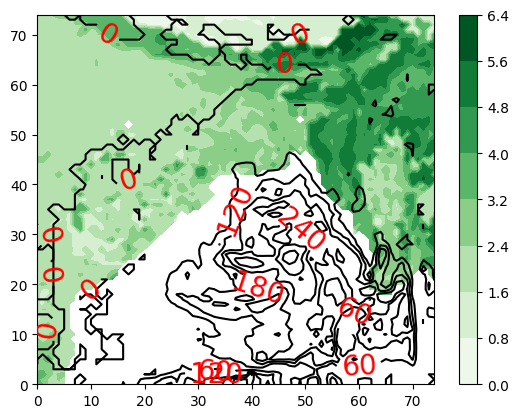

In [95]:
lai = dt.LAI.values[0,:,:].copy()

lai[lai==0] = np.nan

m = plt.contourf(lai, cmap = "Greens")

plt.colorbar(m)

plt.clabel(plt.contour(dt.RAINC.values[0,:,:], colors = 'k'), colors = "red", fontsize = 20)
plt.show()


In [14]:
variables = {
    "Times": "Time of the simulation step",
    "XLAT": "Latitude coordinate of the grid point",
    "XLONG": "Longitude coordinate of the grid point",
    "LU_INDEX": "Land use index",
    "ZNU": "Scalar wind profile parameter",
    "ZNW": "Scalar wind profile parameter",
    "ZS": "Height above ground level",
    "DZS": "Change in height levels",
    "VAR_SSO": "Surface state variable",
    "BATHYMETRY_FLAG": "Flag indicating bathymetry data presence",
    "U": "U-component of wind",
    "V": "V-component of wind",
    "W": "Vertical wind component",
    "PH": "Hydrostatic pressure",
    "PHB": "Base hydrostatic pressure",
    "T": "Temperature",
    "THM": "Potential temperature",
    "HFX_FORCE": "Surface heat flux forcing",
    "LH_FORCE": "Latent heat flux forcing",
    "TSK_FORCE": "Skin temperature forcing",
    "HFX_FORCE_TEND": "Tendency of surface heat flux forcing",
    "LH_FORCE_TEND": "Tendency of latent heat flux forcing",
    "TSK_FORCE_TEND": "Tendency of skin temperature forcing",
    "MU": "Mean coordinate for moist processes",
    "MUB": "Mean buoyancy coordinate",
    "NEST_POS": "Position of the nested grid",
    "P": "Pressure",
    "PB": "Base pressure",
    "FNM": "Filename of the output data",
    "FNP": "Filename path",
    "RDNW": "Radiative downward flux at the top of the atmosphere",
    "RDN": "Radiative downward flux at the surface",
    "DNW": "Downward flux at the top of the atmosphere",
    "DN": "Downward flux at the surface",
    "CFN": "Control function for numerical stability",
    "CFN1": "Secondary control function",
    "THIS_IS_AN_IDEAL_RUN": "Flag indicating ideal run conditions",
    "P_HYD": "Hydrostatic pressure",
    "Q2": "Specific humidity at 2 meters",
    "T2": "Temperature at 2 meters",
    "TH2": "Potential temperature at 2 meters",
    "PSFC": "Surface pressure",
    "U10": "10-meter U-component of wind",
    "V10": "10-meter V-component of wind",
    "RDX": "Horizontal diffusion coefficient in the x-direction",
    "RDY": "Horizontal diffusion coefficient in the y-direction",
    "AREA2D": "Area of the grid cell",
    "DX2D": "Grid spacing in the x-direction",
    "RESM": "Resolution of the model",
    "ZETATOP": "Topographic height parameter",
    "CF1": "Control factor 1",
    "CF2": "Control factor 2",
    "CF3": "Control factor 3",
    "ITIMESTEP": "Current timestep index",
    "XTIME": "Elapsed simulation time",
    "QVAPOR": "Vapor concentration in the air",
    "QCLOUD": "Cloud moisture concentration",
    "QRAIN": "Rainwater concentration",
    "QICE": "Ice water concentration",
    "QSNOW": "Snow water concentration",
    "QGRAUP": "Graupel concentration",
    "QNICE": "Concentration of nice (very small) ice particles",
    "QNRAIN": "Concentration of rain",
    "SHDMAX": "Maximum soil moisture holding capacity",
    "SHDMIN": "Minimum soil moisture holding capacity",
    "SNOALB": "Snow albedo",
    "TSLB": "Surface temperature of the land",
    "SMOIS": "Soil moisture content",
    "SH2O": "Soil water content",
    "SMCREL": "Soil moisture relative compressibility",
    "SEAICE": "Sea ice concentration",
    "XICEM": "Ice water content in the grid",
    "SFROFF": "Surface runoff",
    "UDROFF": "Underground runoff",
    "IVGTYP": "Vegetation type",
    "ISLTYP": "Soil type",
    "VEGFRA": "Vegetation fraction",
    "GRDFLX": "Ground heat flux",
    "ACGRDFLX": "Accumulated ground heat flux",
    "ACSNOM": "Accumulated snow mass",
    "SNOW": "Snow amount present",
    "SNOWH": "Snow height",
    "CANWAT": "Water content in canopy",
    "SSTSK": "Skin sea surface temperature",
    "WATER_DEPTH": "Water depth at the grid point",
    "COSZEN": "Cosine of solar zenith angle",
    "LAI": "Leaf Area Index",
    "DTAUX3D": "Change in wind stress due to 3D dynamics",
    "DTAUY3D": "Change in wind stress due to 3D dynamics",
    "DUSFCG": "Surface gradient of U-component of wind",
    "DVSFCG": "Surface gradient of V-component of wind",
    "VAR": "Variable for Stochastic Physics",
    "CON": "Concentration of constituents",
    "OA1": "Output array 1",
    "OA2": "Output array 2",
    "OA3": "Output array 3",
    "OA4": "Output array 4",
    "OL1": "Output list 1",
    "OL2": "Output list 2",
    "OL3": "Output list 3",
    "OL4": "Output list 4",
    "MAPFAC_M": "Mapping factor for mass",
    "MAPFAC_U": "Mapping factor for U wind component",
    "MAPFAC_V": "Mapping factor for V wind component",
    "MAPFAC_MX": "Mapping factor for mass in x-direction",
    "MAPFAC_MY": "Mapping factor for mass in y-direction",
    "MAPFAC_UX": "Mapping factor for U in x-direction",
    "MAPFAC_UY": "Mapping factor for U in y-direction",
    "MAPFAC_VX": "Mapping factor for V in x-direction",
    "MF_VX_INV": "Inverse mapping factor for V in x-direction",
    "MAPFAC_VY": "Mapping factor for V in y-direction",
    "F": "Coriolis force",
    "E": "Earth's gravitational acceleration",
    "SINALPHA": "Sine of the angle for wind calculations",
    "COSALPHA": "Cosine of the angle for wind calculations",
    "HGT": "Geopotential height",
    "TSK": "Surface temperature",
    "P_TOP": "Pressure at the top boundary layer",
    "GOT_VAR_SSO": "Flag indicating availability of SSO data",
    "T00": "Temperature at initialization",
    "P00": "Pressure at initialization",
    "TLP": "Temperature for the lapse rate",
    "TISO": "Isothermal temperature profile",
    "TLP_STRAT": "Temperature profile in stratosphere",
    "P_STRAT": "Pressure profile in stratosphere",
    "MAX_MSFTX": "Maximum mixed-layer surface flux in x-direction",
    "MAX_MSFTY": "Maximum mixed-layer surface flux in y-direction",
    "RAINC": "Rainfall accumulation",
    "RAINSH": "Rainfall from shredder method",
    "RAINNC": "Non-convective rainfall accumulation",
    "SNOWNC": "Non-convective snowfall",
    "GRAUPELNC": "Non-convective graupel",
    "HAILNC": "Non-convective hail",
    "CLDFRA": "Cloud fraction",
    "SWDOWN": "Downward shortwave radiation",
    "GLW": "Ground longwave radiation",
    "SWNORM": "Normalized shortwave radiation",
    "OLR": "Outgoing longwave radiation",
    "XLAT_U": "Latitude coordinate for U wind component",
    "XLONG_U": "Longitude coordinate for U wind component",
    "XLAT_V": "Latitude coordinate for V wind component",
    "XLONG_V": "Longitude coordinate for V wind component",
    "ALBEDO": "Surface albedo",
    "CLAT": "Current latitude",
    "ALBBCK": "Albedo for the background",
    "EMISS": "Surface emissivity",
    "NOAHRES": "Noah land surface model reservoir",
    "TMN": "Minimum temperature",
    "XLAND": "Fraction of land",
    "UST": "Friction velocity",
    "PBLH": "Planetary boundary layer height",
    "HFX": "Surface heat flux",
    "QFX": "Surface moisture flux",
    "LH": "Latent heat",
    "ACHFX": "Change in surface heat flux",
    "ACLHF": "Change in latent heat flux",
    "SNOWC": "Snow cover",
    "SR": "Shortwave radiation",
    "SAVE_TOPO_FROM_REAL": "Flag indicating saving of topographic data",
    "ISEEDARR_SPPT": "Seed array for stochastic physics",
    "ISEEDARR_SKEBS": "Seed array for stochastic K-Ed",
    "ISEEDARR_RAND_PERTURB": "Seed array for random perturbations",
    "ISEEDARRAY_SPP_CONV": "Seed array for convective schemes",
    "ISEEDARRAY_SPP_PBL": "Seed array for PBL schemes",
    "ISEEDARRAY_SPP_LSM": "Seed array for land surface models",
    "C1H": "Coefficient for humidity parameterization",
    "C2H": "Second coefficient for humidity parameterization",
    "C1F": "Coefficient used in flux calculations",
    "C2F": "Second coefficient used in flux calculations",
    "C3H": "Third coefficient for humidity parameterization",
    "C4H": "Fourth coefficient for humidity parameterization",
    "C3F": "Third coefficient used in flux calculations",
    "C4F": "Fourth coefficient used in flux calculations",
    "PCB": "Point concentration balance",
    "PC": "Point concentration",
    "LANDMASK": "Mask indicating land (1) and ocean (0)",
    "LAKEMASK": "Mask indicating lakes",
    "SST": "Sea surface temperature",
    "SST_INPUT": "Input sea surface temperature"
}

